#Connecting Google Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# U-net + dice loss 

## Loading Data

In [2]:
'''Using 4 sets made by pre-processing one by one each having training set of 3780, validaiton of 1260 and test data of 1260 slices of mri scans'''

'Using 4 sets made by pre-processing one by one each having training set of 3780, validaiton of 1260 and test data of 1260 slices of mri scans'

In [3]:
import numpy as np

In [4]:
# X_train = np.load('./Training Data/X_train1.npy',mmap_mode='r')
# Y_train = np.load('./Training Data/Y_train1.npy',mmap_mode='r')
X_train = np.load('/content/drive/MyDrive/Unet3plus/Training Data/X_train2.npy',mmap_mode='r')
Y_train = np.load('/content/drive/MyDrive/Unet3plus/Training Data/Y_train2.npy',mmap_mode='r')
# X_train = np.load('/content/drive/MyDrive/Unet3plus/Training Data/X_train3.npy',mmap_mode='r')
# Y_train = np.load('/content/drive/MyDrive/Unet3plus/Training Data/Y_train3.npy',mmap_mode='r')
# X_train = np.load('/content/drive/MyDrive/Unet3plus/Training Data/X_train4.npy',mmap_mode='r')
# Y_train = np.load('/content/drive/MyDrive/Unet3plus/Training Data/Y_train4.npy',mmap_mode='r')

In [5]:
# X_val = np.load('./Validation Data/X_val1.npy',mmap_mode='r')
# Y_val = np.load('./Validation Data/Y_val1.npy',mmap_mode='r')
X_val = np.load('/content/drive/MyDrive/Unet3plus/Validation Data/X_val2.npy',mmap_mode='r')
Y_val = np.load('/content/drive/MyDrive/Unet3plus/Validation Data/Y_val2.npy',mmap_mode='r')
# X_val = np.load('/content/drive/MyDrive/Unet3plus/Validation Data/X_val3.npy',mmap_mode='r')
# Y_val = np.load('/content/drive/MyDrive/Unet3plus/Validation Data/Y_val3.npy',mmap_mode='r')
# X_val = np.load('/content/drive/MyDrive/Unet3plus/Validation Data/X_val4.npy',mmap_mode='r')
# Y_val = np.load('/content/drive/MyDrive/Unet3plus/Validation Data/Y_val4.npy',mmap_mode='r')

In [6]:
X_train.shape,Y_train.shape,X_val.shape,Y_val.shape

((3780, 192, 192, 4),
 (3780, 192, 192, 4),
 (1260, 192, 192, 4),
 (1260, 192, 192, 4))

In [7]:
#  %tensorflow_version 1.x
from tensorflow.keras.models import Model
from tensorflow.keras.layers import MaxPooling2D,Conv2D,Dense,BatchNormalization,concatenate,Input,Dropout,Maximum,Activation,Dense,Flatten,UpSampling2D,Conv2DTranspose
from tensorflow.keras.optimizers import SGD,Adam,RMSprop
import tensorflow.keras.callbacks as callbacks
import tensorflow.keras.initializers as initializers
from tensorflow.keras.callbacks import Callback
from tensorflow.keras import regularizers
import tensorflow as tf
import tensorflow.keras as k

In [8]:
def conv_block(x, kernels, kernel_size=(3, 3), strides=(1, 1), padding='same', is_bn=True, is_relu=True, n=2):
    for i in range(1, n + 1):
        x = k.layers.Conv2D(filters=kernels, kernel_size=kernel_size, padding=padding, strides=strides,
                            kernel_regularizer=tf.keras.regularizers.l2(1e-4),
                            kernel_initializer=k.initializers.he_normal(seed=5))(x)
        if is_bn:
            x = k.layers.BatchNormalization()(x)
        if is_relu:
            x = k.activations.relu(x)

    return x

In [9]:
############################################ U-net 3+ #############################################

# filters = [64, 128, 256, 512, 1024]
filters = [ 32, 64, 128, 256, 512, 1024]
OUTPUT_CHANNELS = 4
 ## -------------Encoder--------------
input_layer = k.layers.Input(shape=(192,192,4), name="input_layer")
# block 1
e1 = conv_block(input_layer, filters[0])		# 192*192*64
e2 = k.layers.MaxPool2D(pool_size=(2, 2))(e1) 		# 96*96*64
# block 2
e2 = conv_block(e2, filters[1])				# 96*96*128
e3 = k.layers.MaxPool2D(pool_size=(2, 2))(e2)		# 48*48*128
# block 3
e3 = conv_block(e3, filters[2])				# 48*48*256
e4 = k.layers.MaxPool2D(pool_size=(2, 2))(e3)		# 24*24*256
# block 4
e4 = conv_block(e4, filters[3])				# 24*24*512
e5 = k.layers.MaxPool2D(pool_size=(2, 2))(e4)		# 12*12*512
# block 5 bottleneck layer
e5 = conv_block(e5, filters[4]) 			# 12*12*1024
## -------------Decoder--------------
cat_channels = filters[0]
cat_blocks = len(filters)
upsample_channels = cat_blocks * cat_channels

""" d4 """
e1_d4 = k.layers.MaxPool2D(pool_size=(8, 8))(e1)                        # 320*320*64  --> 40*40*64
e1_d4 = conv_block(e1_d4, cat_channels, n=1)                       # 320*320*64  --> 40*40*64

e2_d4 = k.layers.MaxPool2D(pool_size=(4, 4))(e2)                        # 160*160*128 --> 40*40*128
e2_d4 = conv_block(e2_d4, cat_channels, n=1)                        # 160*160*128 --> 40*40*64

e3_d4 = k.layers.MaxPool2D(pool_size=(2, 2))(e3)                        # 80*80*256  --> 40*40*256
e3_d4 = conv_block(e3_d4, cat_channels, n=1)                        # 80*80*256  --> 40*40*64

e4_d4 = conv_block(e4, cat_channels, n=1)                          # 40*40*512  --> 40*40*64

e5_d4 = k.layers.UpSampling2D(size=(2, 2), interpolation='bilinear')(e5)  # 80*80*256  --> 40*40*256
e5_d4 = conv_block(e5_d4, cat_channels, n=1)                        # 20*20*1024  --> 20*20*64

d4 = k.layers.concatenate([e1_d4, e2_d4, e3_d4, e4_d4, e5_d4])
d4 = conv_block(d4, upsample_channels, n=1)                         # 40*40*320  --> 40*40*320

""" d3 """
e1_d3 = k.layers.MaxPool2D(pool_size=(4, 4))(e1)    # 320*320*64 --> 80*80*64
e1_d3 = conv_block(e1_d3, cat_channels, n=1)        # 80*80*64 --> 80*80*64

e2_d3 = k.layers.MaxPool2D(pool_size=(2, 2))(e2)    # 160*160*256 --> 80*80*256
e2_d3 = conv_block(e2_d3, cat_channels, n=1)        # 80*80*256 --> 80*80*64

e3_d3 = conv_block(e3, cat_channels, n=1)           # 80*80*512 --> 80*80*64

d4_d3 = k.layers.UpSampling2D(size=(2, 2), interpolation='bilinear')(d4)      # 40*40*320 --> 80*80*320
d4_d3 = conv_block(d4_d3, cat_channels, n=1)        # 80*80*320 --> 80*80*64

e5_d3 = k.layers.UpSampling2D(size=(4, 4), interpolation='bilinear')(e5)      # 20*20*320 --> 80*80*320
e5_d3 = conv_block(e5_d3, cat_channels, n=1)        # 80*80*320 --> 80*80*64

d3 = k.layers.concatenate([e1_d3, e2_d3, e3_d3, d4_d3, e5_d3])
d3 = conv_block(d3, upsample_channels, n=1)         # 80*80*320 --> 80*80*320

""" d2 """
e1_d2 = k.layers.MaxPool2D(pool_size=(2, 2))(e1)    # 320*320*64 --> 160*160*64
e1_d2 = conv_block(e1_d2, cat_channels, n=1)        # 160*160*64 --> 160*160*64

e2_d2 = conv_block(e2, cat_channels, n=1)           # 160*160*256 --> 160*160*64

d3_d2 = k.layers.UpSampling2D(size=(2, 2), interpolation='bilinear')(d3)      # 80*80*320 --> 160*160*320
d3_d2 = conv_block(d3_d2, cat_channels, n=1)        # 160*160*320 --> 160*160*64

d4_d2 = k.layers.UpSampling2D(size=(4, 4), interpolation='bilinear')(d4)      # 40*40*320 --> 160*160*320
d4_d2 = conv_block(d4_d2, cat_channels, n=1)        # 160*160*320 --> 160*160*64

e5_d2 = k.layers.UpSampling2D(size=(8, 8), interpolation='bilinear')(e5)      # 20*20*320 --> 160*160*320
e5_d2 = conv_block(e5_d2, cat_channels, n=1)        # 160*160*320 --> 160*160*64

d2 = k.layers.concatenate([e1_d2, e2_d2, d3_d2, d4_d2, e5_d2])
d2 = conv_block(d2, upsample_channels, n=1)         # 160*160*320 --> 160*160*320

""" d1 """
e1_d1 = conv_block(e1, cat_channels, n=1)      # 320*320*64 --> 320*320*64

d2_d1 = k.layers.UpSampling2D(size=(2, 2), interpolation='bilinear')(d2)      # 160*160*320 --> 320*320*320
d2_d1 = conv_block(d2_d1, cat_channels, n=1)        # 160*160*320 --> 160*160*64

d3_d1 = k.layers.UpSampling2D(size=(4, 4), interpolation='bilinear')(d3)      # 80*80*320 --> 320*320*320
d3_d1 = conv_block(d3_d1, cat_channels, n=1)        # 320*320*320 --> 320*320*64

d4_d1 = k.layers.UpSampling2D(size=(8, 8), interpolation='bilinear')(d4)      # 40*40*320 --> 320*320*320
d4_d1 = conv_block(d4_d1, cat_channels, n=1)        # 320*320*320 --> 320*320*64

e5_d1 = k.layers.UpSampling2D(size=(16, 16), interpolation='bilinear')(e5)    # 20*20*320 --> 320*320*320
e5_d1 = conv_block(e5_d1, cat_channels, n=1)        # 320*320*320 --> 320*320*64

d1 = k.layers.concatenate([e1_d1, d2_d1, d3_d1, d4_d1, e5_d1, ])
d1 = conv_block(d1, upsample_channels, n=1)         # 320*320*320 --> 320*320*320

# last layer does not have batchnorm and relu
d = conv_block(d1, OUTPUT_CHANNELS, n=1, is_bn=False, is_relu=False)
output = k.activations.softmax(d)
model = k.Model(inputs = input_layer, outputs = output)
# model.summary()

In [10]:
# from tensorflow.keras.utils import plot_model
# plot_model(model,to_file='unet.png',show_shapes=True) # plotting later

##Working Area

In [12]:
from tensorflow.keras import backend as K
def dice_coef(y_true, y_pred, epsilon=1e-6):
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    return (2. * intersection) / (K.sum(K.square(y_true),axis=-1) + K.sum(K.square(y_pred),axis=-1) + epsilon)

def dice_coef_loss(y_true, y_pred):
    return 1-dice_coef(y_true, y_pred)

In [13]:
model.compile(optimizer=Adam(learning_rate=1e-5),loss=dice_coef_loss,metrics=[dice_coef])
model.load_weights('/content/drive/MyDrive/Unet3plus/weights.hdf5')
checkpointer = callbacks.ModelCheckpoint(filepath = './Model Checkpoints/weights.hdf5',save_best_only=True)
training_log = callbacks.TensorBoard(log_dir='./Model_logs')

In [14]:
history = model.fit(X_train,Y_train,validation_data=(X_val,Y_val),batch_size=16,epochs=4,callbacks=[training_log,checkpointer],shuffle=True)

Epoch 1/4
237/237 [==============================] - 362s 1s/step - loss: 0.1226 - dice_coef: 0.9934 - val_loss: 0.1207 - val_dice_coef: 0.9946
Epoch 2/4
237/237 [==============================] - 237s 1000ms/step - loss: 0.1194 - dice_coef: 0.9952 - val_loss: 0.1186 - val_dice_coef: 0.9952
Epoch 3/4
237/237 [==============================] - 255s 1s/step - loss: 0.1173 - dice_coef: 0.9957 - val_loss: 0.1164 - val_dice_coef: 0.9957
Epoch 4/4
237/237 [==============================] - 256s 1s/step - loss: 0.1152 - dice_coef: 0.9960 - val_loss: 0.1143 - val_dice_coef: 0.9960


*`Train over all 4 datasets before proceeding to testing`*

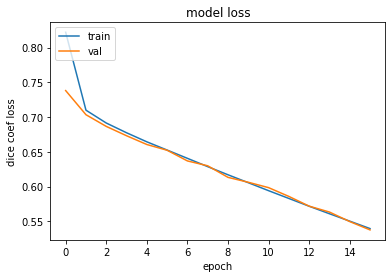

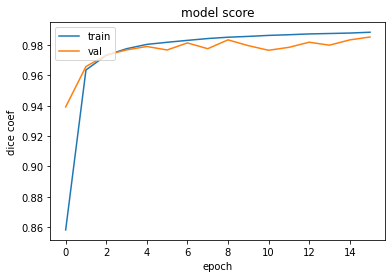

In [ ]:
# summarize history for loss
import matplotlib.pyplot as plt
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('dice coef loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
plt.plot(history.history['dice_coef'])
plt.plot(history.history['val_dice_coef'])
plt.title('model score')
plt.ylabel('dice coef')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
# X_test = np.load('./Test Data/X_test1.npy')
# Y_test = np.load('./Test Data/Y_test1.npy')
# X_test = np.load('./Test Data/X_test2.npy')
# Y_test = np.load('./Test Data/Y_test2.npy')
# X_test = np.load('./Test Data/X_test3.npy')
# Y_test = np.load('./Test Data/Y_test3.npy')
X_test = np.load('./Test Data/X_test4.npy')
Y_test = np.load('./Test Data/Y_test4.npy')

In [ ]:
Y_pre = np.argmax(model.predict(X_test),axis=-1)

In [ ]:
np.unique(Y_pre)

array([0, 1, 2, 3])

In [ ]:
Y_pre.shape

(1350, 192, 192)

In [ ]:
Y_pre=Y_pre.reshape(-1,192,192,1)

In [ ]:
Y_test.shape,X_test.shape

((1350, 192, 192, 1), (1350, 192, 192, 4))

X_test 450


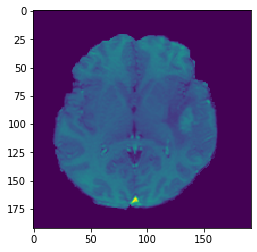

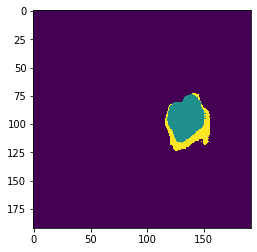

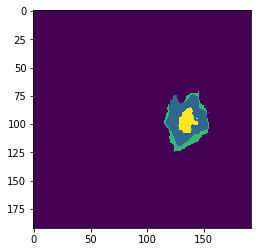

X_test 451


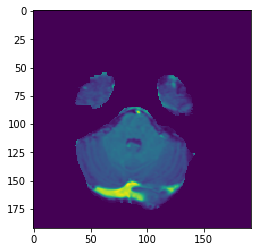

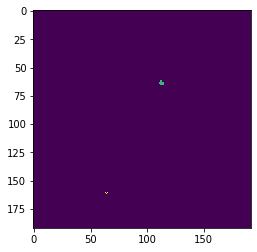

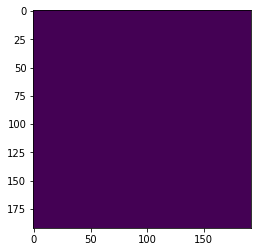

X_test 452


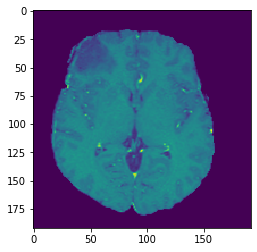

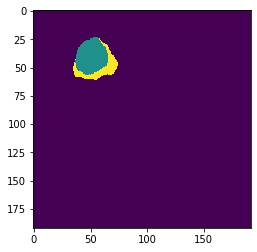

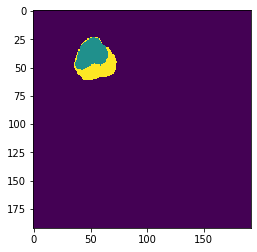

X_test 453


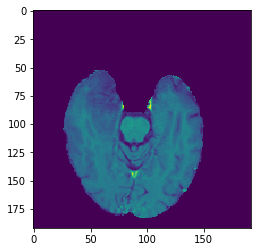

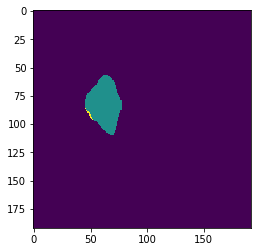

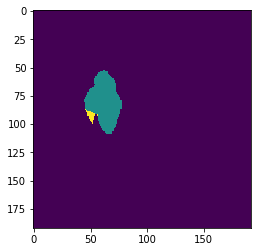

X_test 454


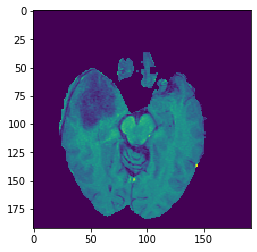

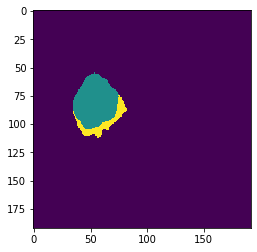

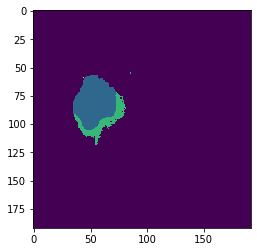

X_test 455


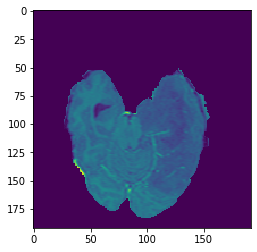

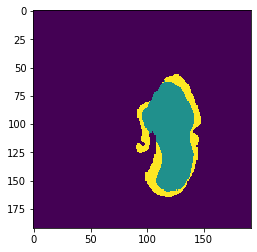

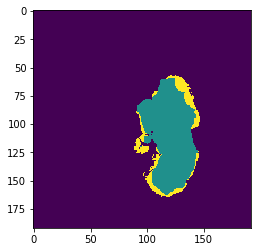

X_test 456


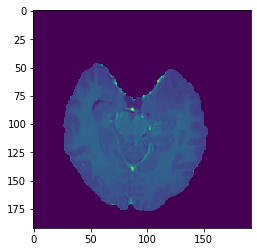

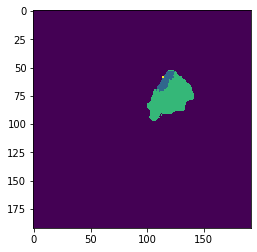

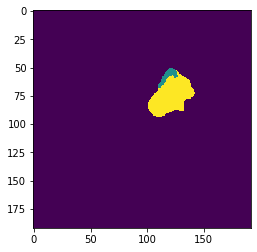

X_test 457


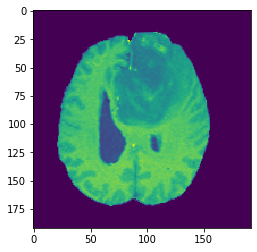

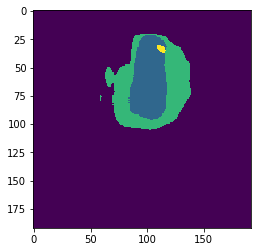

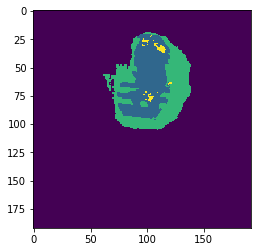

X_test 458


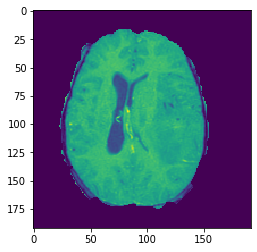

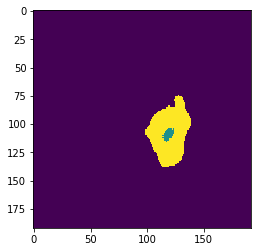

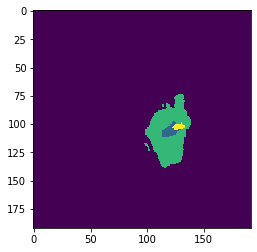

X_test 459


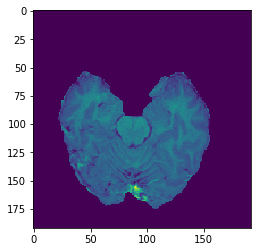

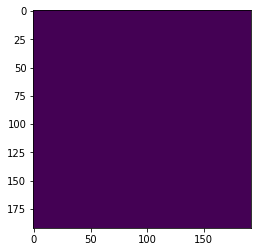

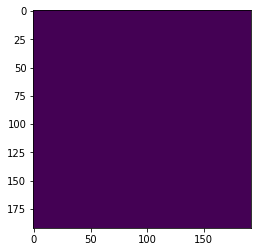

X_test 460


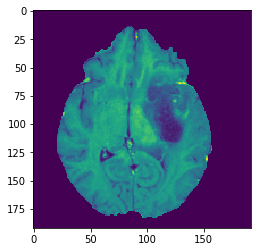

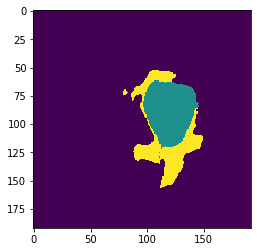

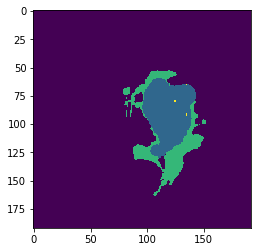

X_test 461


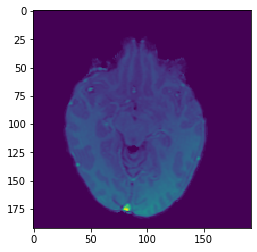

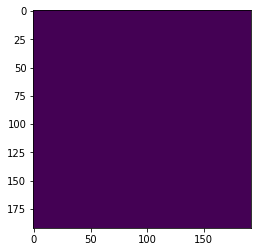

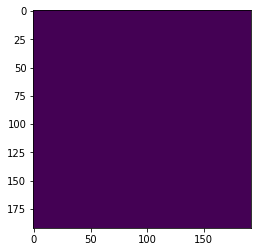

X_test 462


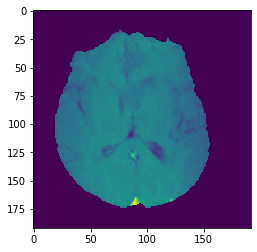

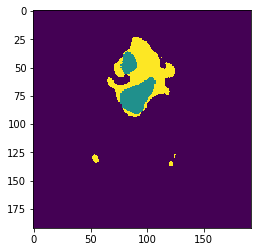

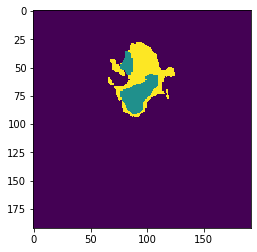

X_test 463


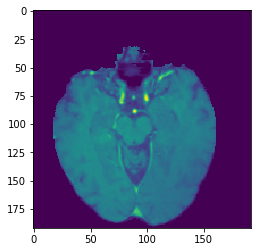

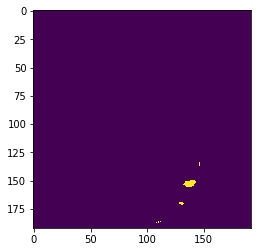

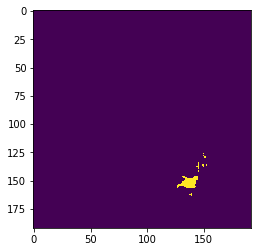

X_test 464


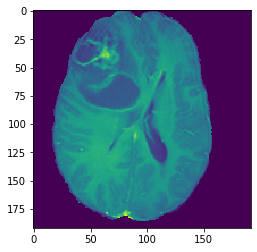

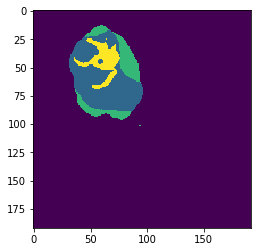

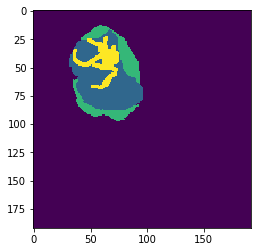

X_test 465


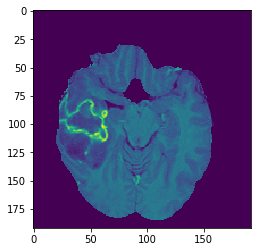

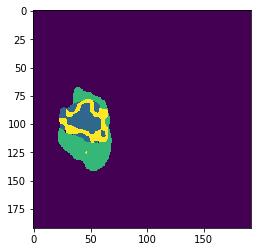

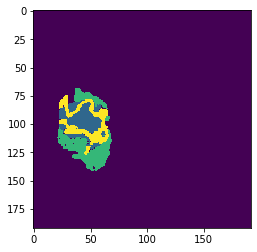

X_test 466


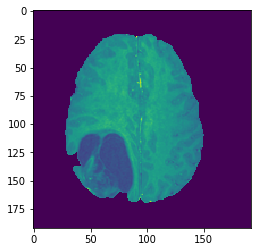

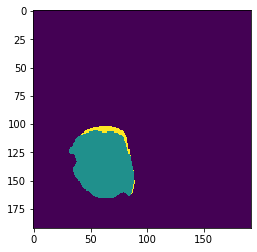

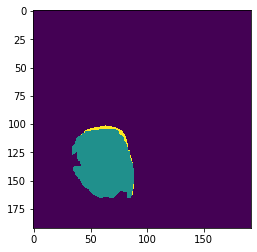

X_test 467


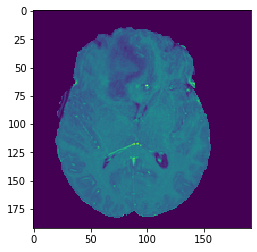

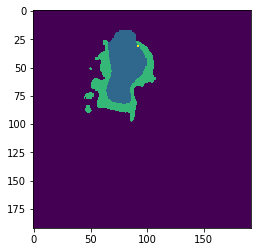

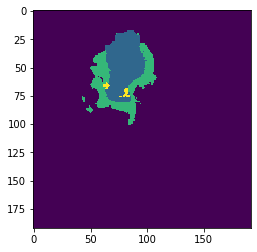

X_test 468


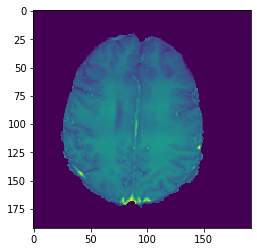

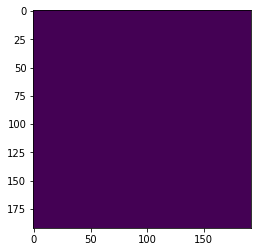

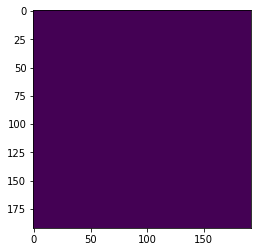

X_test 469


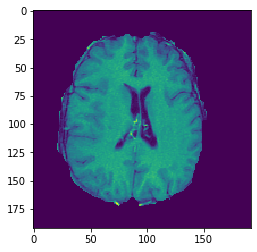

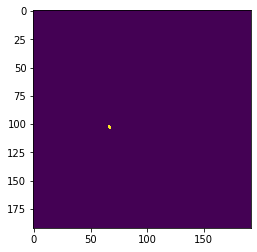

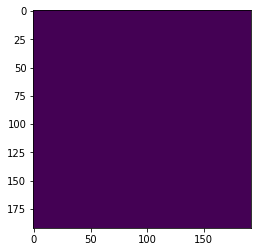

X_test 470


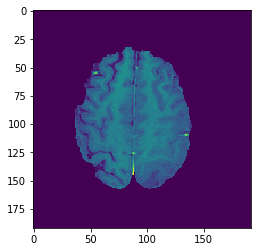

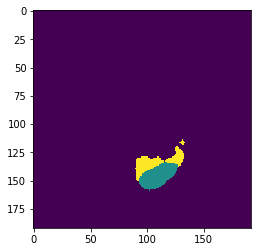

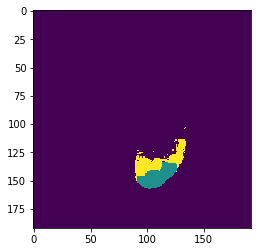

X_test 471


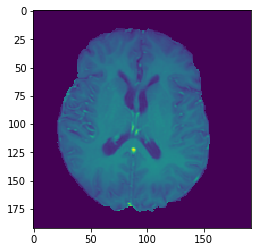

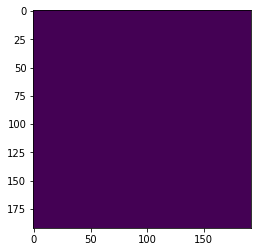

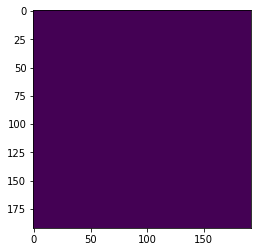

X_test 472


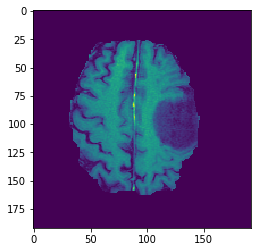

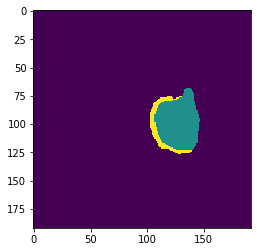

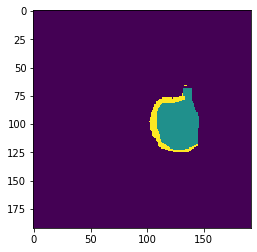

X_test 473


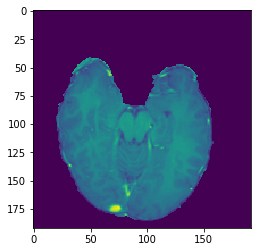

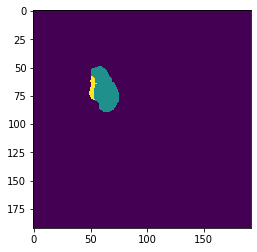

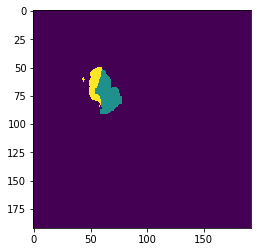

X_test 474


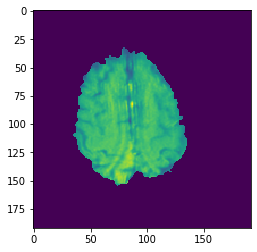

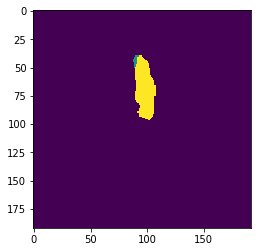

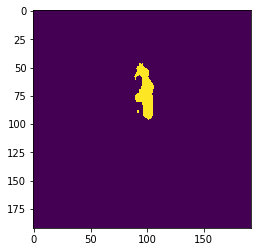

X_test 475


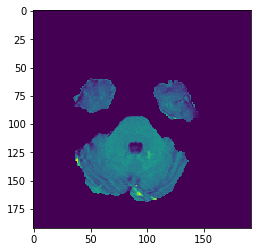

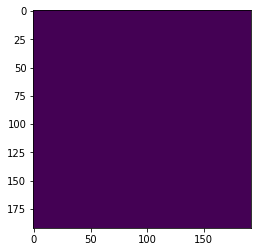

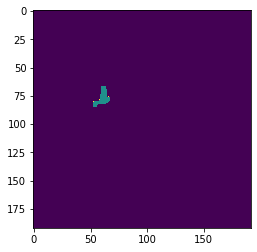

X_test 476


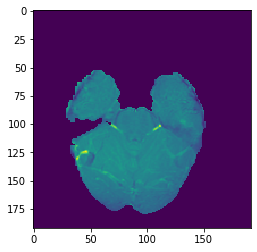

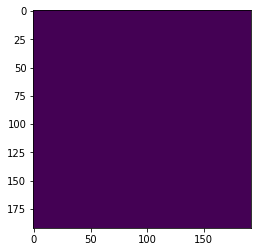

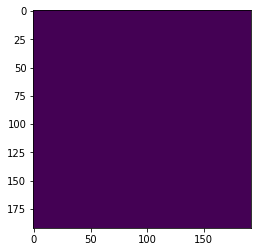

X_test 477


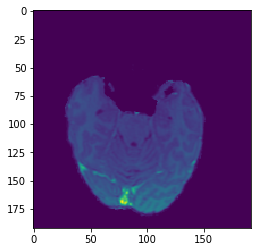

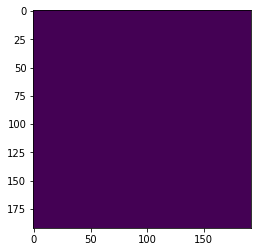

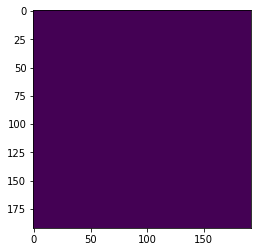

X_test 478


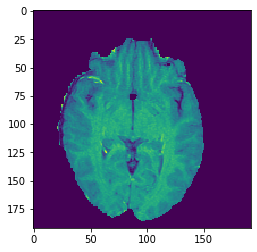

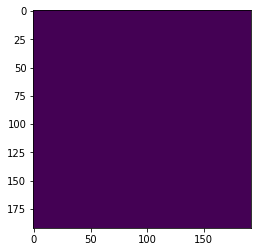

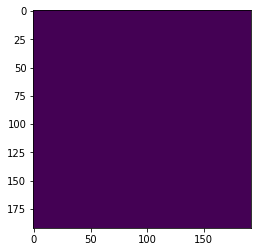

X_test 479


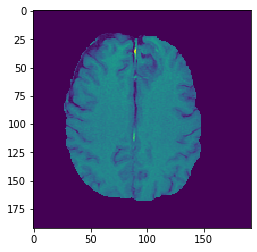

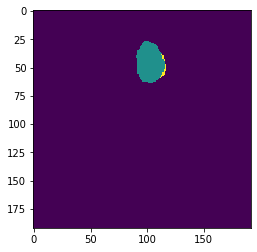

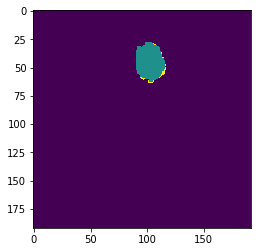

X_test 480


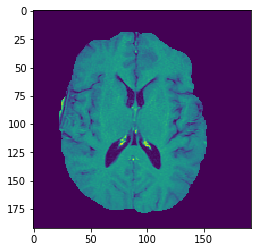

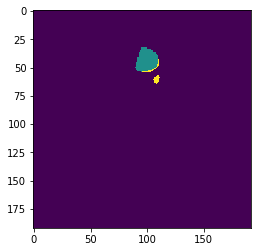

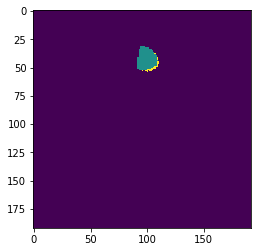

X_test 481


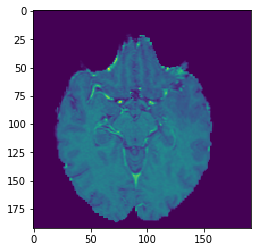

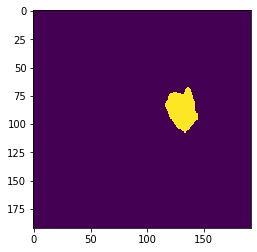

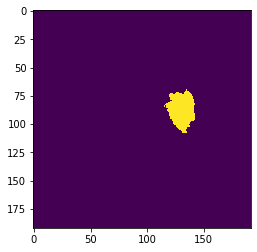

X_test 482


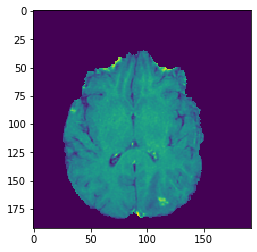

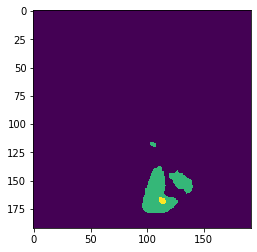

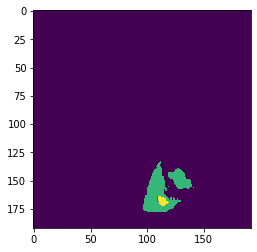

X_test 483


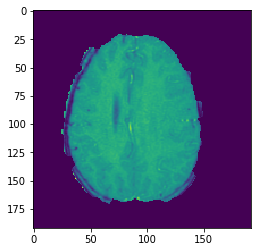

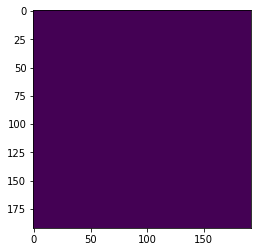

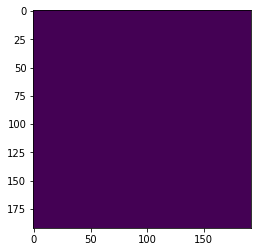

X_test 484


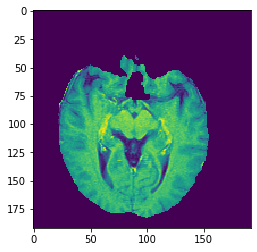

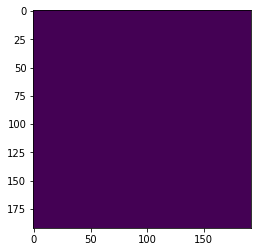

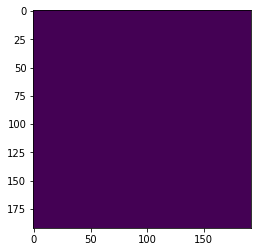

X_test 485


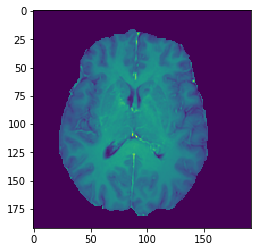

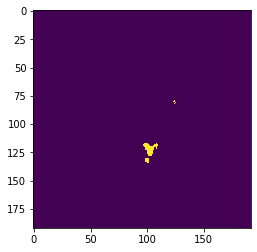

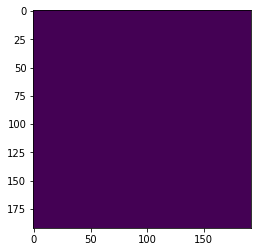

X_test 486


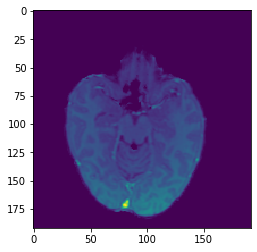

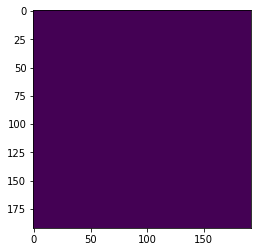

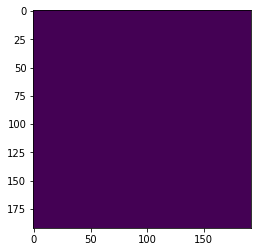

X_test 487


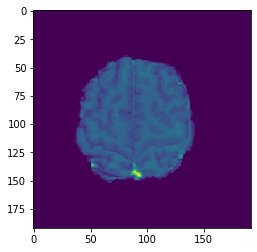

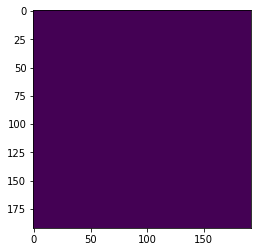

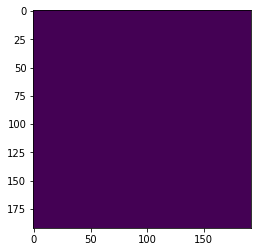

X_test 488


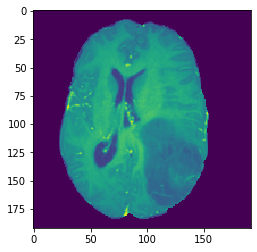

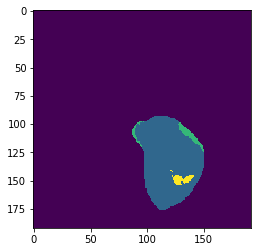

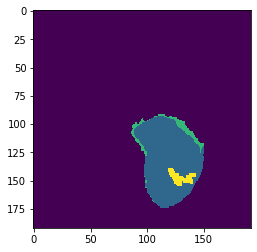

X_test 489


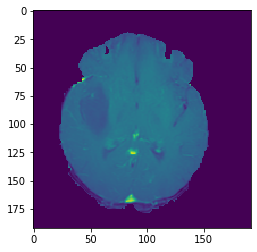

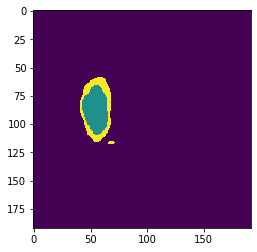

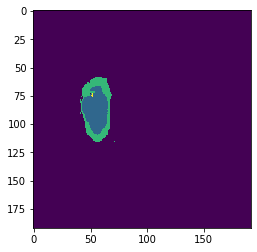

X_test 490


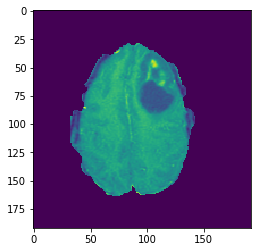

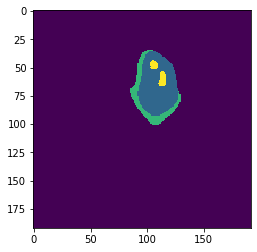

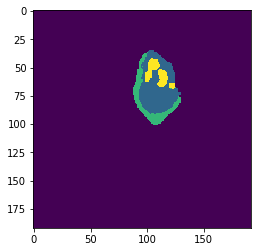

X_test 491


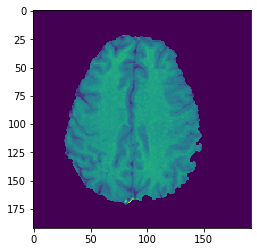

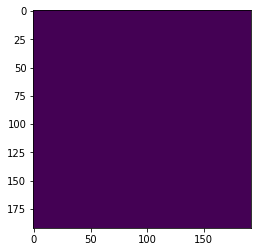

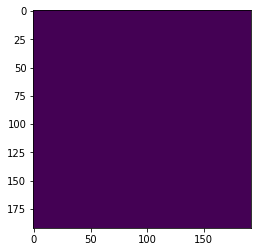

X_test 492


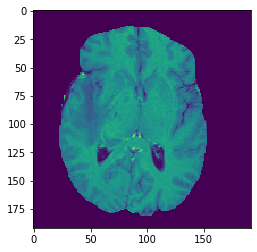

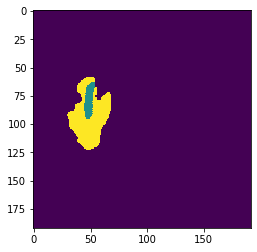

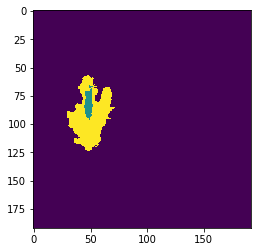

X_test 493


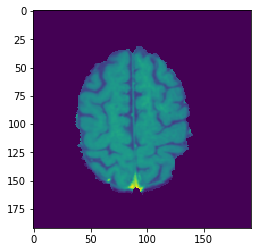

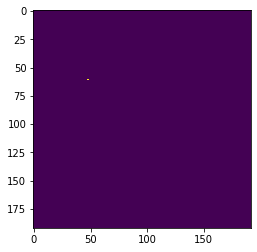

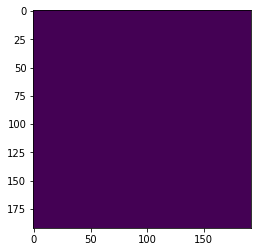

X_test 494


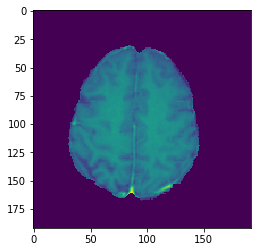

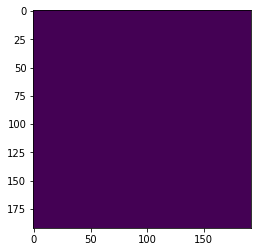

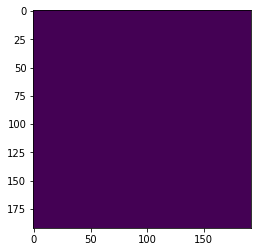

X_test 495


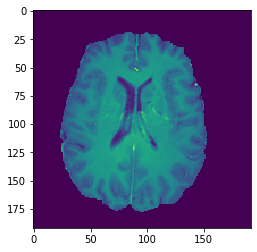

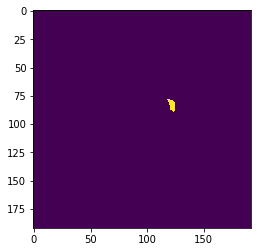

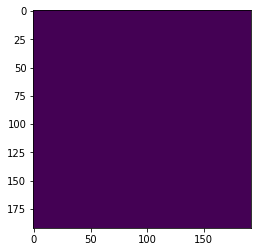

X_test 496


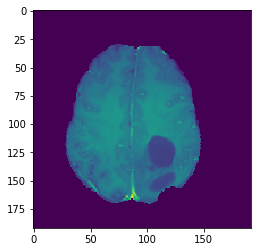

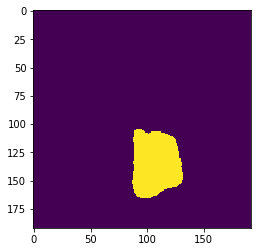

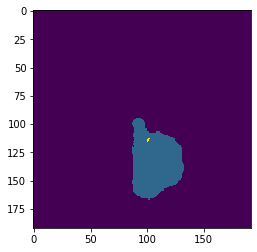

X_test 497


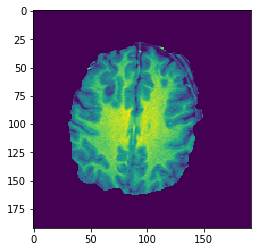

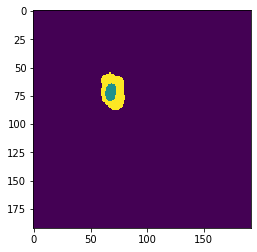

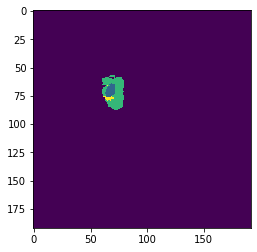

X_test 498


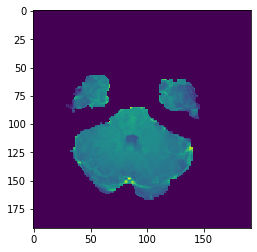

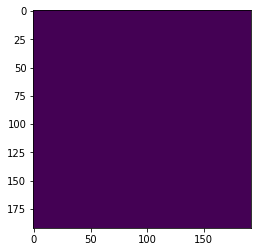

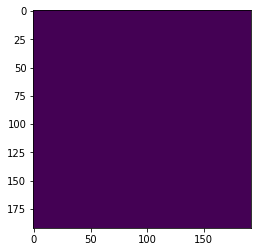

X_test 499


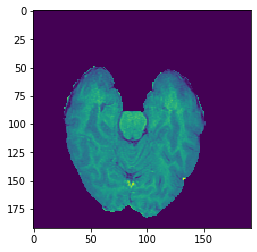

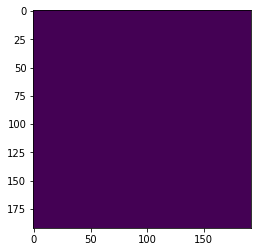

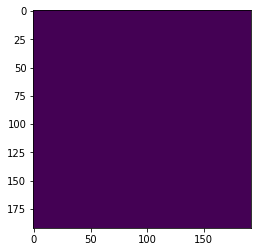

In [ ]:
for i in range(450,500):
  print('X_test '+ str(i))
  plt.imshow(X_test[i,:,:,2])
  plt.show()
  plt.imshow(Y_pre[i,:,:,0])
  plt.show()
  plt.imshow(Y_test[i,:,:,0])
  plt.show()

In [ ]:
from tensorflow.keras.utils import to_categorical
Y_test_encod = to_categorical(Y_test)

NameError: ignored

In [ ]:
model.evaluate(X_test,Y_test_encod,verbose=0)

[0.005474171455673598, 0.9945260692525792]

In [ ]:
model.save('./Saved Models /model.h5',overwrite=True)

#Evaluation of the Model

In [15]:
import numpy as np
X_test1 = np.load('/content/drive/MyDrive/Unet3plus/Test Data/X_test1.npy',mmap_mode='r')
X_test2 = np.load('/content/drive/MyDrive/Unet3plus/Test Data/X_test2.npy',mmap_mode='r')
X_test3 = np.load('/content/drive/MyDrive/Unet3plus/Test Data/X_test3.npy',mmap_mode='r')
X_test4 = np.load('/content/drive/MyDrive/Unet3plus/Test Data/X_test4.npy',mmap_mode='r')

Y_test1 = np.load('/content/drive/MyDrive/Unet3plus/Test Data/Y_test1.npy',mmap_mode='r')
Y_test2 = np.load('/content/drive/MyDrive/Unet3plus/Test Data/Y_test2.npy',mmap_mode='r')
Y_test3 = np.load('/content/drive/MyDrive/Unet3plus/Test Data/Y_test3.npy',mmap_mode='r')
Y_test4 = np.load('/content/drive/MyDrive/Unet3plus/Test Data/Y_test4.npy',mmap_mode='r')

In [16]:
from tensorflow.keras.utils import to_categorical
Y_test_encod1 = to_categorical(Y_test1)
Y_test_encod2 = to_categorical(Y_test2)
Y_test_encod3 = to_categorical(Y_test3)
Y_test_encod4 = to_categorical(Y_test4)

In [17]:
model.compile(optimizer=Adam(lr=1e-5),loss=[dice_coef_loss],metrics=[dice_coef])

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/optimizer_v2/optimizer_v2.py:375: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  "The `lr` argument is deprecated, use `learning_rate` instead.")


In [ ]:
model.load_weights('/content/drive/MyDrive/Unet3plus/weights.hdf5')

In [18]:
print('HGG Test set no: 1 with Dice Coefficient:- %.4f'%float(list(model.evaluate(X_test1,Y_test_encod1,batch_size=32,verbose=1))[1]))
print('HGG Test set no: 2 with Dice Coefficient:- %.4f'%float(list(model.evaluate(X_test2,Y_test_encod2,batch_size=32,verbose=1))[1]))
print('HGG Test set no: 3 with Dice Coefficient:- %.4f'%float(list(model.evaluate(X_test3,Y_test_encod3,batch_size=32,verbose=1))[1]))
print('LGG Test set no: 4 with Dice Coefficient:- %.4f'%float(list(model.evaluate(X_test4,Y_test_encod4,batch_size=32,verbose=1))[1]))

40/40 [==============================] - 32s 597ms/step - loss: 0.1245 - dice_coef: 0.9858
HGG Test set no: 1 with Dice Coefficient:- 0.9858
40/40 [==============================] - 22s 560ms/step - loss: 0.1143 - dice_coef: 0.9960
HGG Test set no: 2 with Dice Coefficient:- 0.9960
40/40 [==============================] - 24s 596ms/step - loss: 0.1246 - dice_coef: 0.9857
HGG Test set no: 3 with Dice Coefficient:- 0.9857
43/43 [==============================] - 28s 646ms/step - loss: 0.1312 - dice_coef: 0.9791
LGG Test set no: 4 with Dice Coefficient:- 0.9791


In [ ]:
Y_pred1 = np.argmax(model.predict(X_test1),axis=-1).reshape(-1,192,192,1)
Y_pred2 = np.argmax(model.predict(X_test2),axis=-1).reshape(-1,192,192,1)
Y_pred3 = np.argmax(model.predict(X_test3),axis=-1).reshape(-1,192,192,1)
Y_pred4 = np.argmax(model.predict(X_test4),axis=-1).reshape(-1,192,192,1)

HGG test set no: 1 slice no: 450


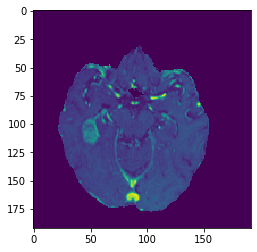

Predicted:- 


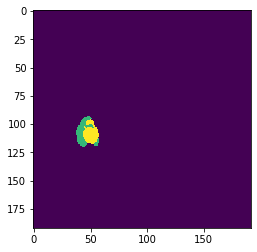

Actual:- 


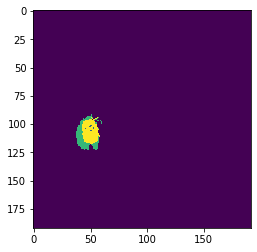

HGG test set no: 1 slice no: 451


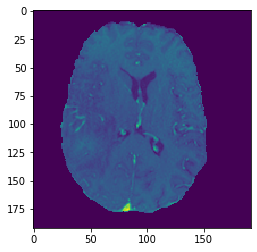

Predicted:- 


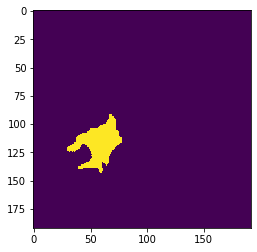

Actual:- 


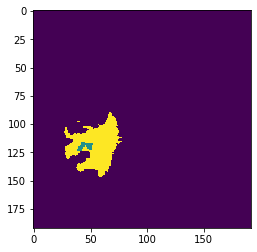

HGG test set no: 1 slice no: 452


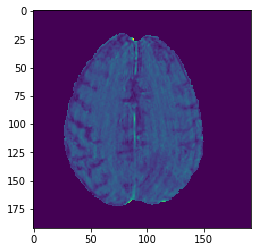

Predicted:- 


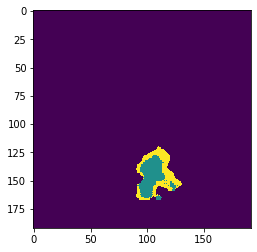

Actual:- 


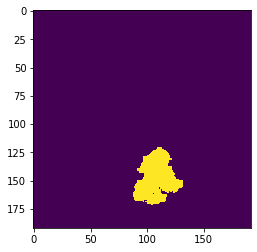

HGG test set no: 1 slice no: 453


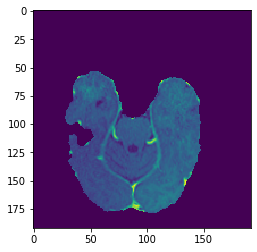

Predicted:- 


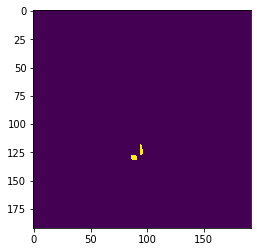

Actual:- 


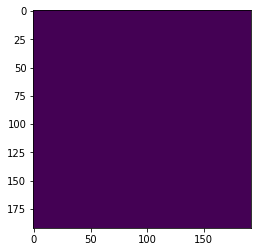

HGG test set no: 1 slice no: 454


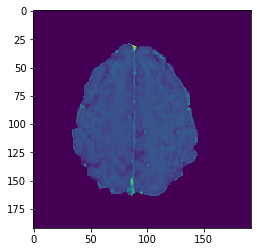

Predicted:- 


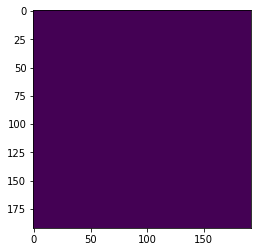

Actual:- 


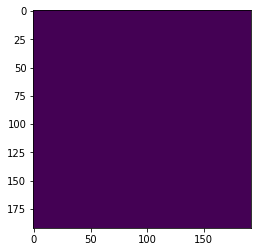

HGG test set no: 1 slice no: 455


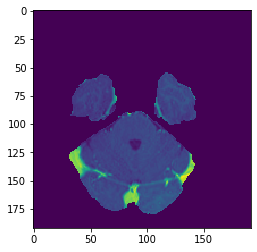

Predicted:- 


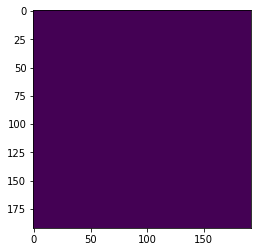

Actual:- 


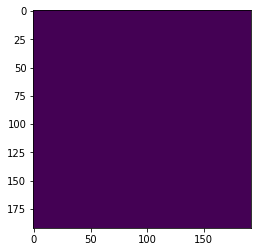

HGG test set no: 1 slice no: 456


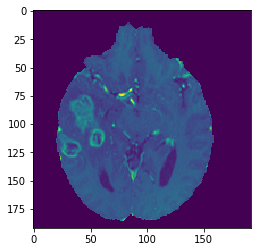

Predicted:- 


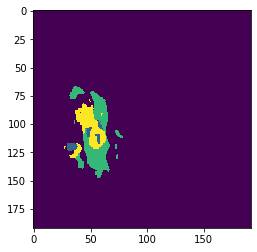

Actual:- 


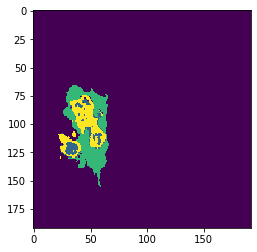

HGG test set no: 1 slice no: 457


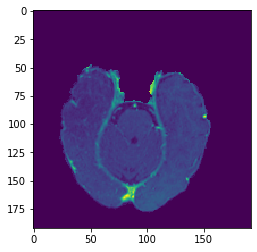

Predicted:- 


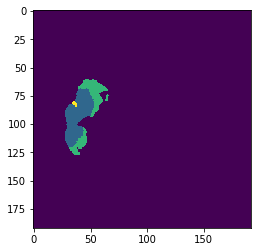

Actual:- 


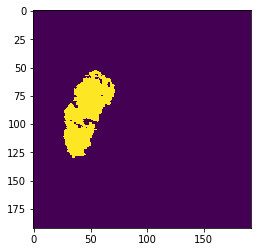

HGG test set no: 1 slice no: 458


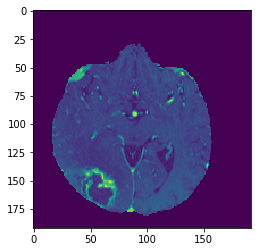

Predicted:- 


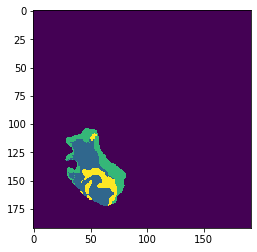

Actual:- 


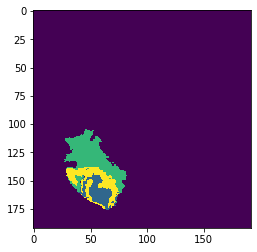

HGG test set no: 1 slice no: 459


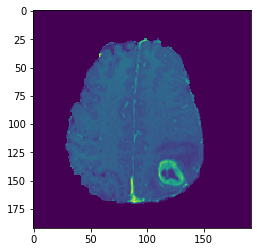

Predicted:- 


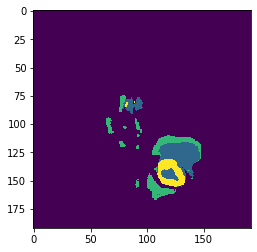

Actual:- 


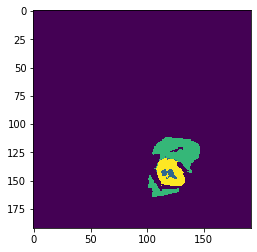

HGG test set no: 1 slice no: 460


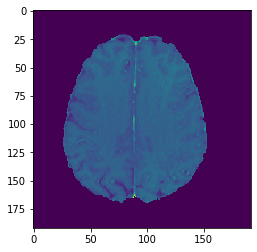

Predicted:- 


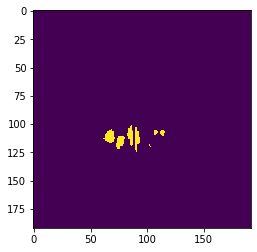

Actual:- 


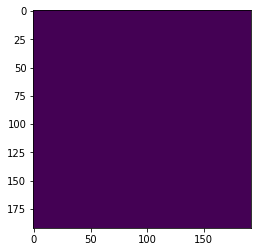

HGG test set no: 1 slice no: 461


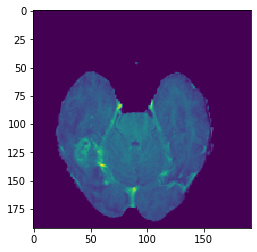

Predicted:- 


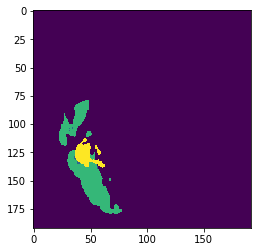

Actual:- 


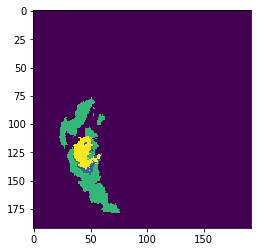

HGG test set no: 1 slice no: 462


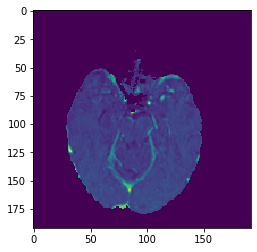

Predicted:- 


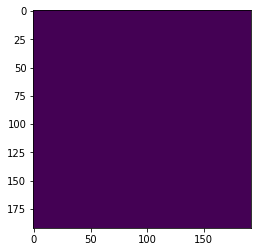

Actual:- 


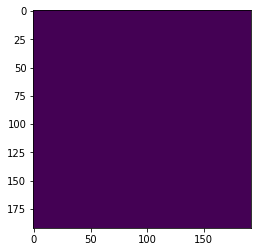

HGG test set no: 1 slice no: 463


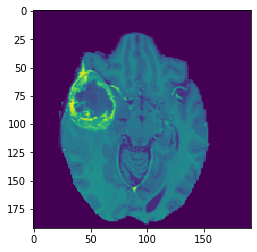

Predicted:- 


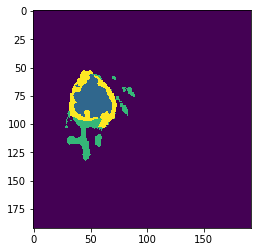

Actual:- 


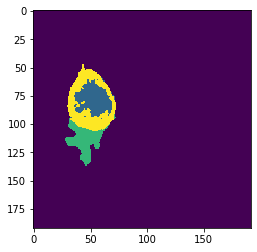

HGG test set no: 1 slice no: 464


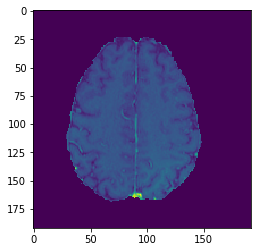

Predicted:- 


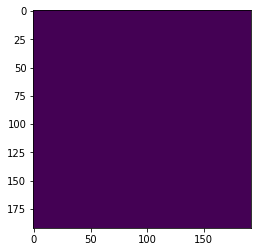

Actual:- 


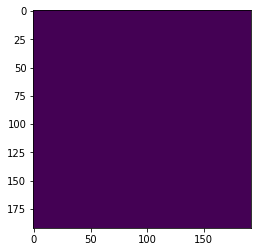

HGG test set no: 1 slice no: 465


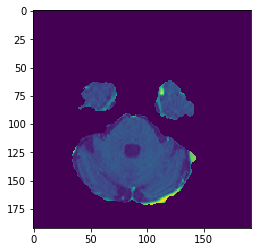

Predicted:- 


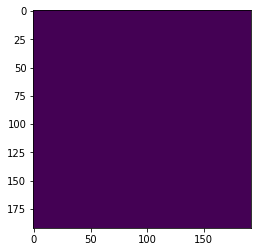

Actual:- 


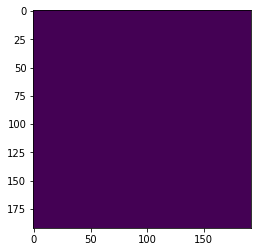

HGG test set no: 1 slice no: 466


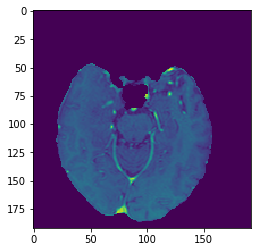

Predicted:- 


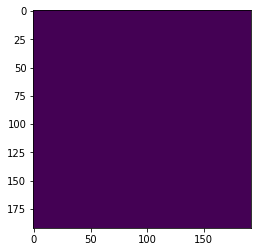

Actual:- 


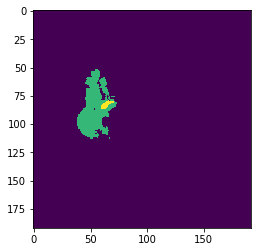

HGG test set no: 1 slice no: 467


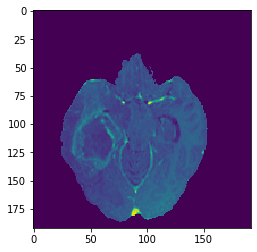

Predicted:- 


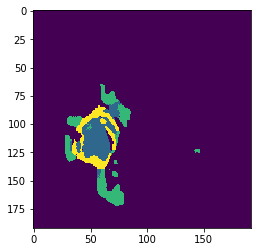

Actual:- 


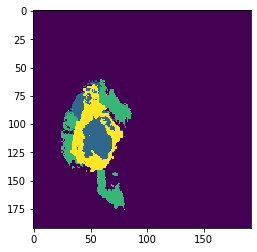

HGG test set no: 1 slice no: 468


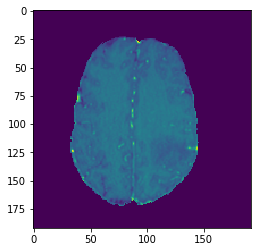

Predicted:- 


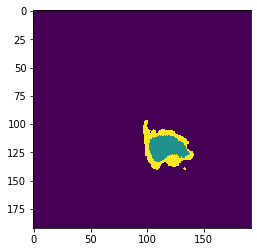

Actual:- 


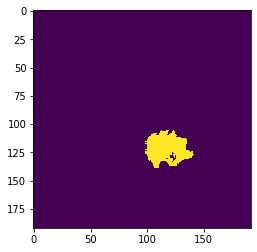

HGG test set no: 1 slice no: 469


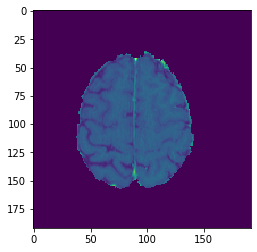

Predicted:- 


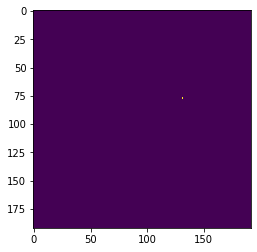

Actual:- 


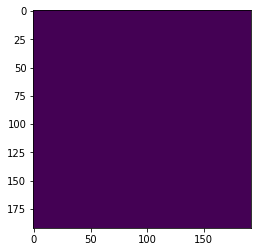

HGG test set no: 1 slice no: 470


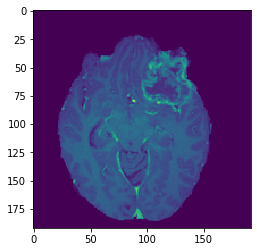

Predicted:- 


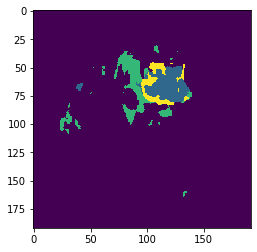

Actual:- 


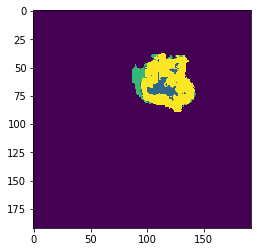

HGG test set no: 1 slice no: 471


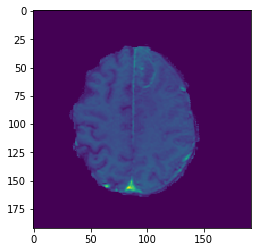

Predicted:- 


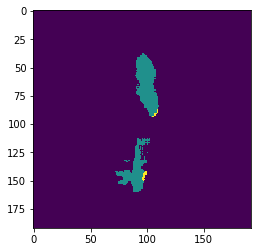

Actual:- 


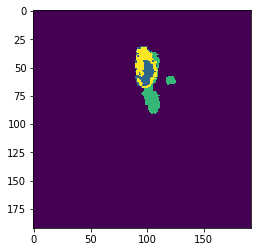

HGG test set no: 1 slice no: 472


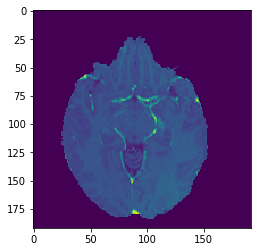

Predicted:- 


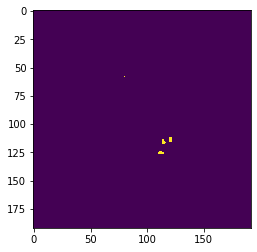

Actual:- 


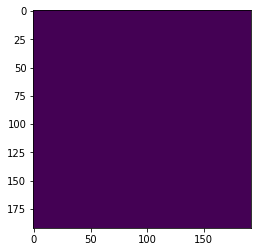

HGG test set no: 1 slice no: 473


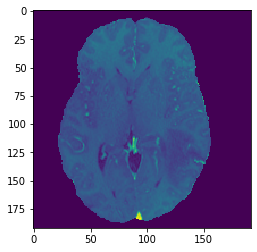

Predicted:- 


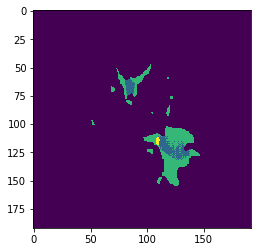

Actual:- 


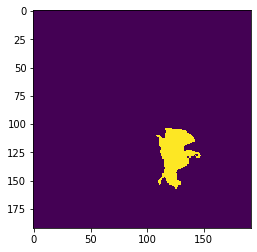

HGG test set no: 1 slice no: 474


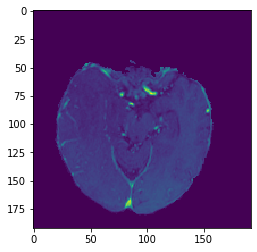

Predicted:- 


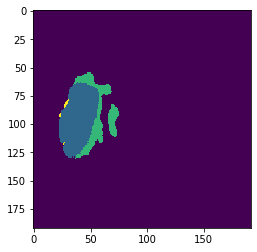

Actual:- 


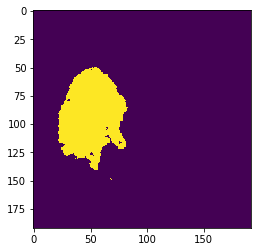

HGG test set no: 1 slice no: 475


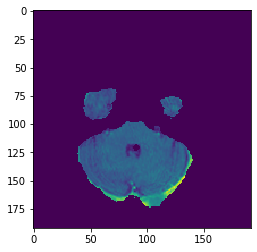

Predicted:- 


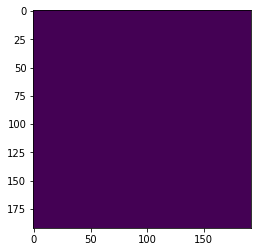

Actual:- 


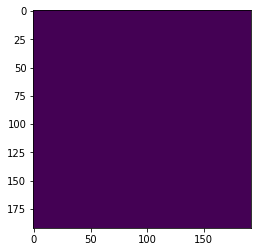

HGG test set no: 1 slice no: 476


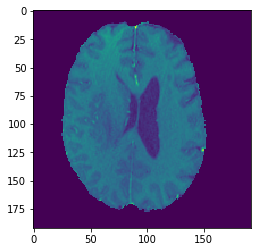

Predicted:- 


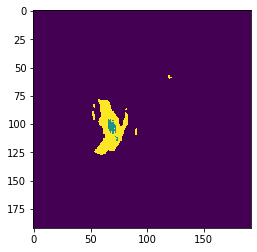

Actual:- 


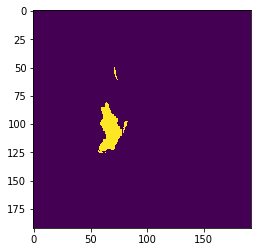

HGG test set no: 1 slice no: 477


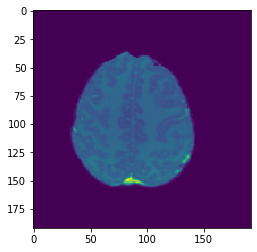

Predicted:- 


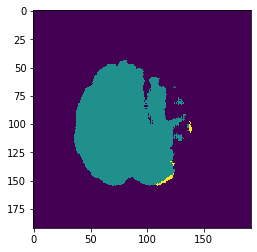

Actual:- 


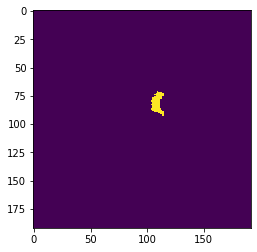

HGG test set no: 1 slice no: 478


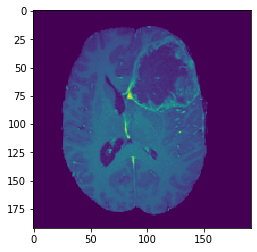

Predicted:- 


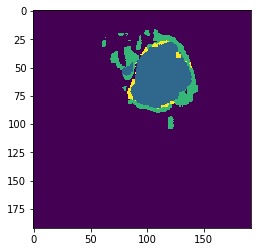

Actual:- 


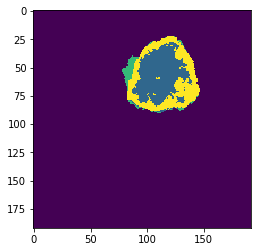

HGG test set no: 1 slice no: 479


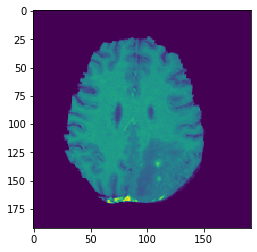

Predicted:- 


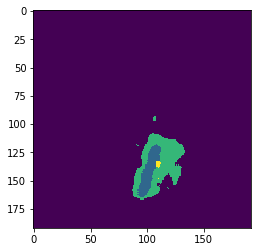

Actual:- 


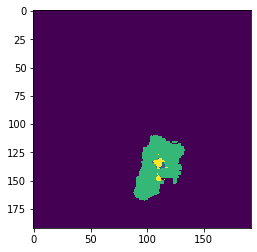

HGG test set no: 1 slice no: 480


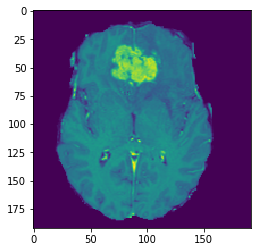

Predicted:- 


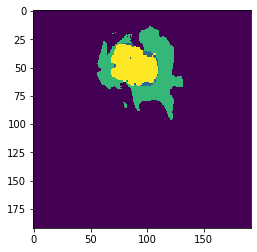

Actual:- 


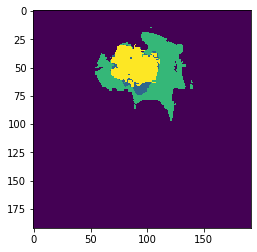

HGG test set no: 1 slice no: 481


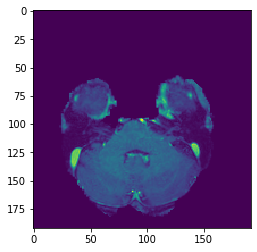

Predicted:- 


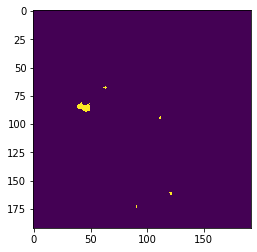

Actual:- 


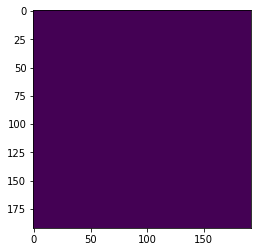

HGG test set no: 1 slice no: 482


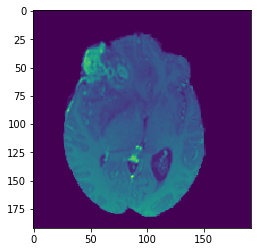

Predicted:- 


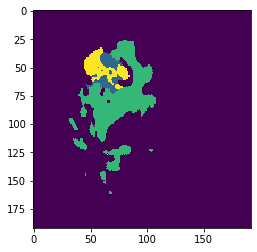

Actual:- 


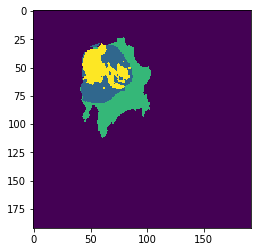

HGG test set no: 1 slice no: 483


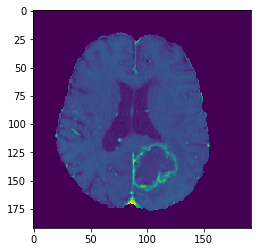

Predicted:- 


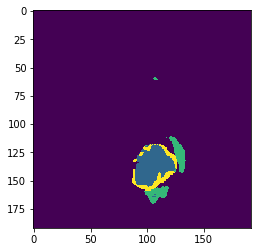

Actual:- 


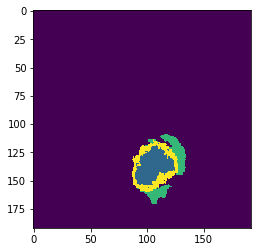

HGG test set no: 1 slice no: 484


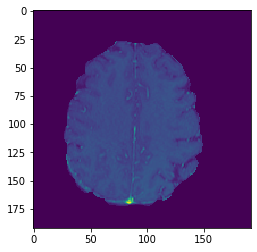

Predicted:- 


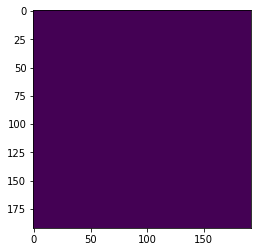

Actual:- 


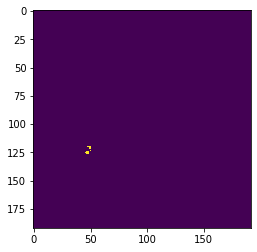

HGG test set no: 1 slice no: 485


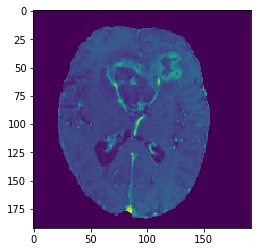

Predicted:- 


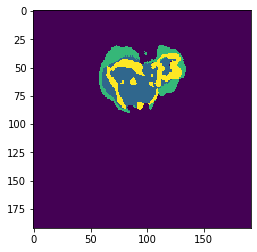

Actual:- 


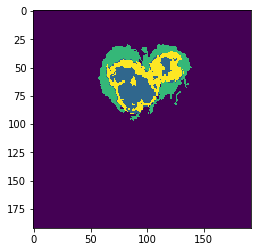

HGG test set no: 1 slice no: 486


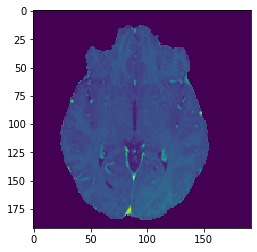

Predicted:- 


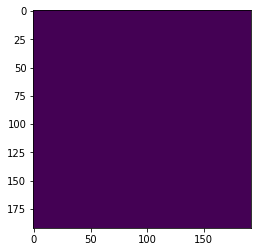

Actual:- 


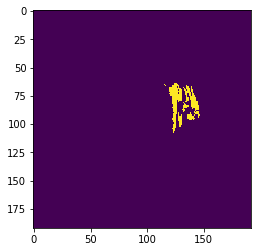

HGG test set no: 1 slice no: 487


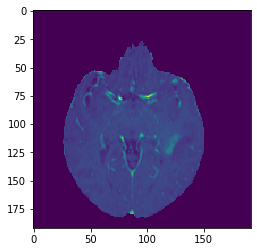

Predicted:- 


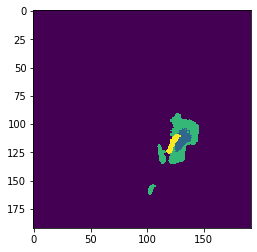

Actual:- 


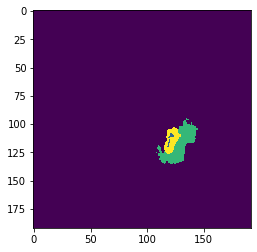

HGG test set no: 1 slice no: 488


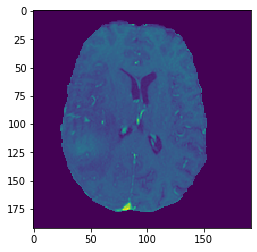

Predicted:- 


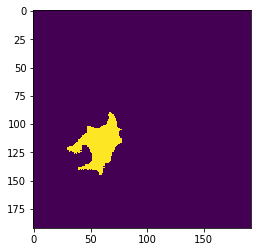

Actual:- 


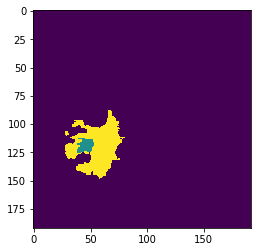

HGG test set no: 1 slice no: 489


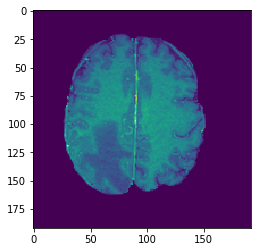

Predicted:- 


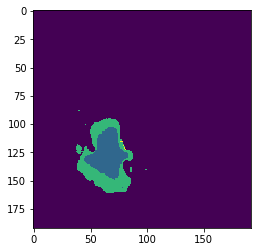

Actual:- 


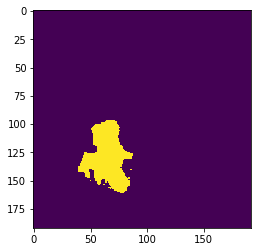

HGG test set no: 1 slice no: 490


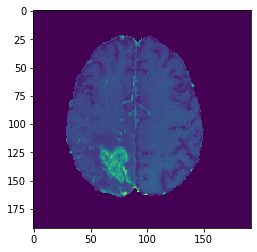

Predicted:- 


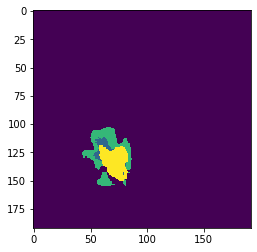

Actual:- 


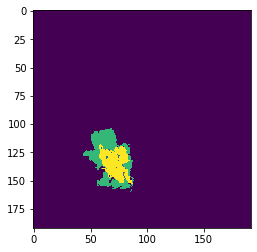

HGG test set no: 1 slice no: 491


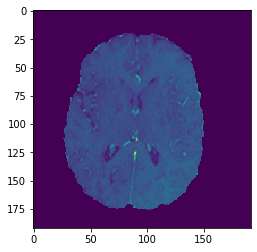

Predicted:- 


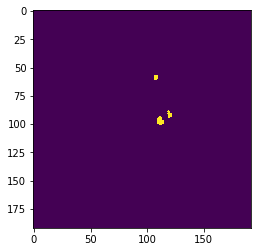

Actual:- 


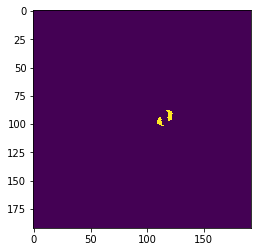

HGG test set no: 1 slice no: 492


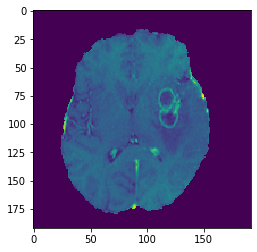

Predicted:- 


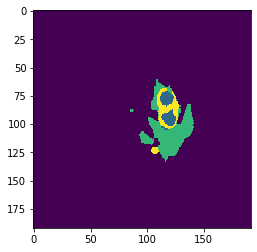

Actual:- 


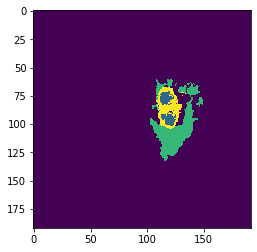

HGG test set no: 1 slice no: 493


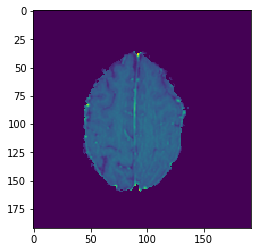

Predicted:- 


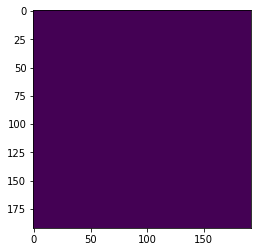

Actual:- 


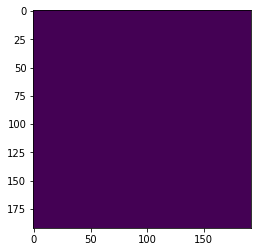

HGG test set no: 1 slice no: 494


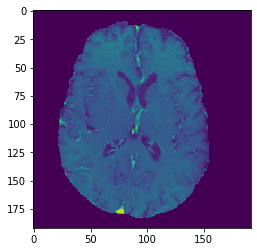

Predicted:- 


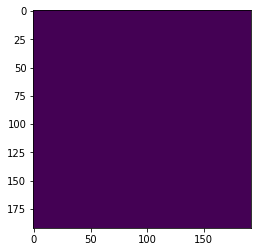

Actual:- 


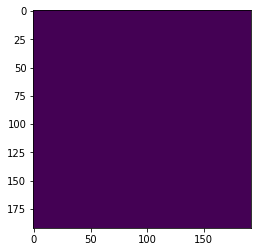

HGG test set no: 1 slice no: 495


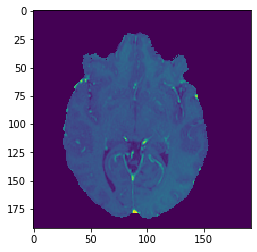

Predicted:- 


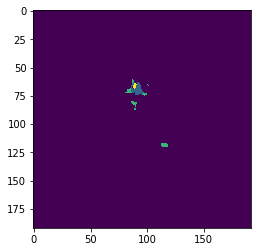

Actual:- 


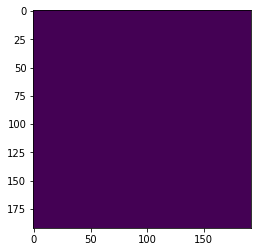

HGG test set no: 1 slice no: 496


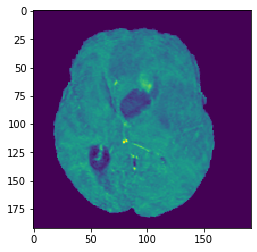

Predicted:- 


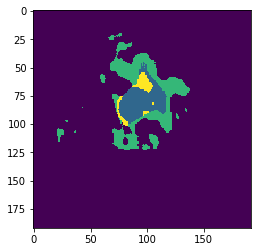

Actual:- 


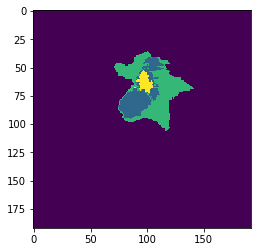

HGG test set no: 1 slice no: 497


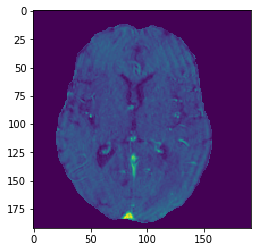

Predicted:- 


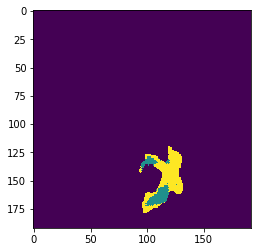

Actual:- 


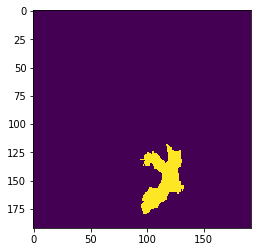

HGG test set no: 1 slice no: 498


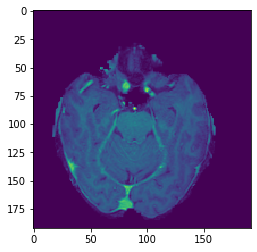

Predicted:- 


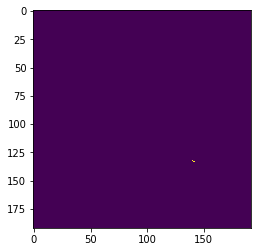

Actual:- 


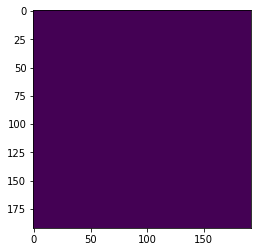

HGG test set no: 1 slice no: 499


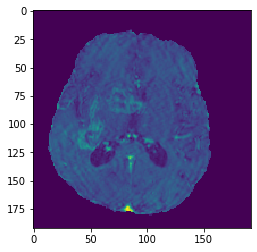

Predicted:- 


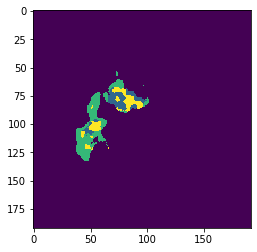

Actual:- 


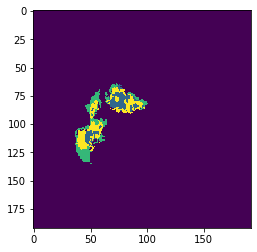

HGG test set no: 2 slice no: 450


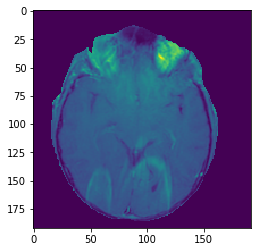

Predicted:- 


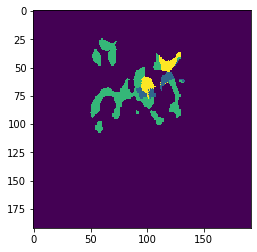

Actual:- 


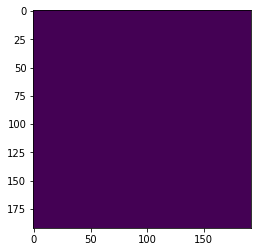

HGG test set no: 2 slice no: 451


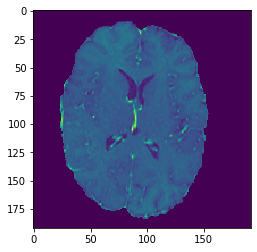

Predicted:- 


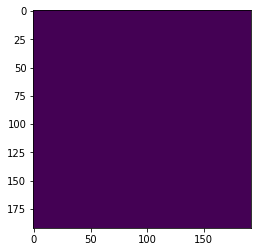

Actual:- 


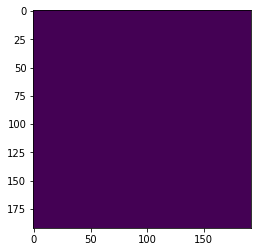

HGG test set no: 2 slice no: 452


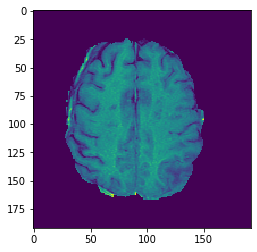

Predicted:- 


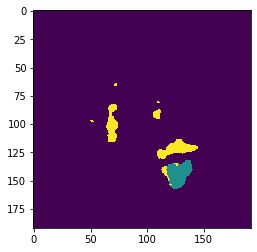

Actual:- 


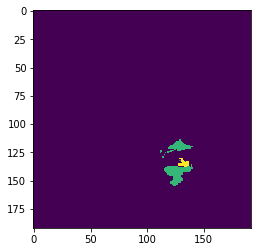

HGG test set no: 2 slice no: 453


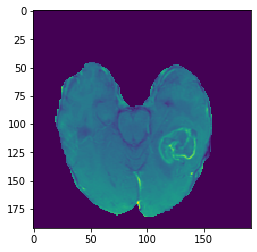

Predicted:- 


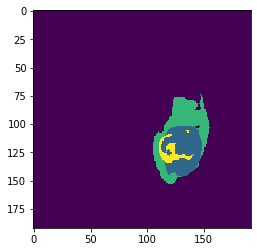

Actual:- 


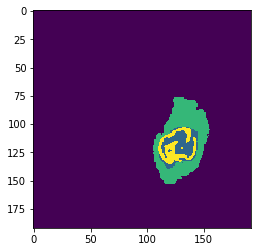

HGG test set no: 2 slice no: 454


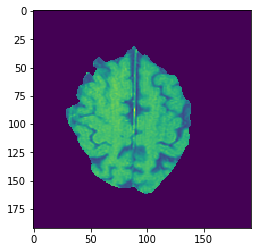

Predicted:- 


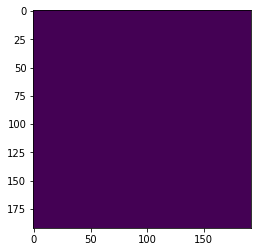

Actual:- 


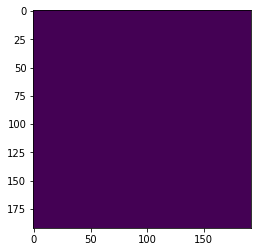

HGG test set no: 2 slice no: 455


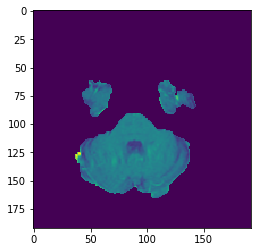

Predicted:- 


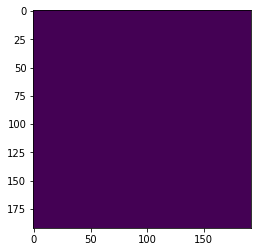

Actual:- 


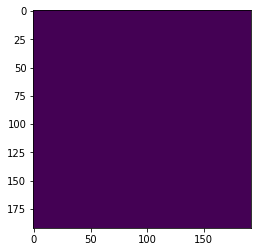

HGG test set no: 2 slice no: 456


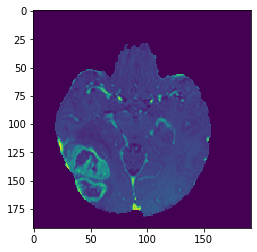

Predicted:- 


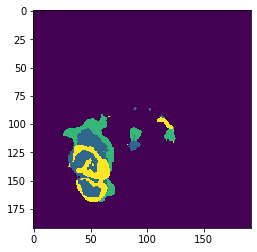

Actual:- 


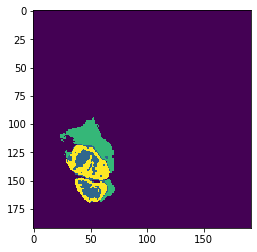

HGG test set no: 2 slice no: 457


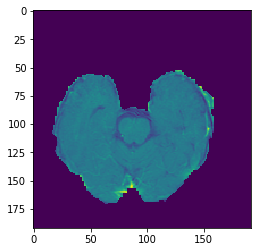

Predicted:- 


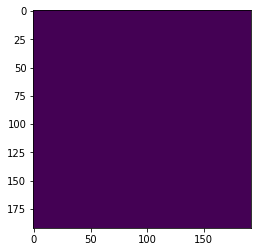

Actual:- 


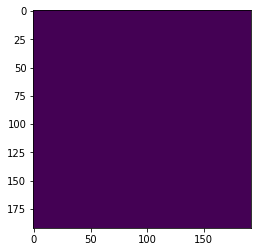

HGG test set no: 2 slice no: 458


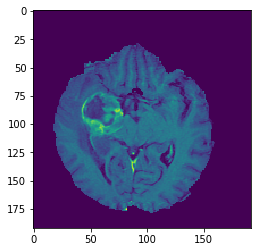

Predicted:- 


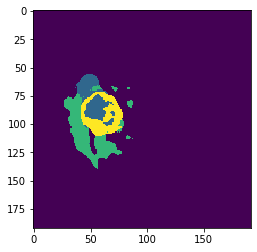

Actual:- 


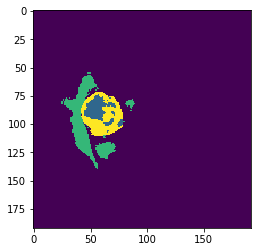

HGG test set no: 2 slice no: 459


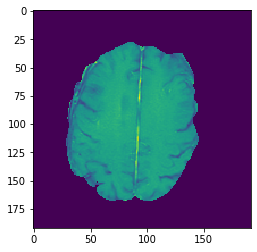

Predicted:- 


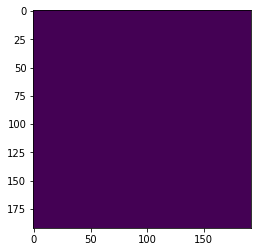

Actual:- 


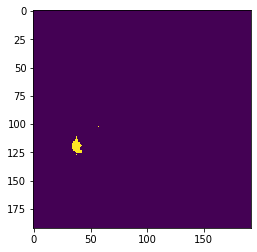

HGG test set no: 2 slice no: 460


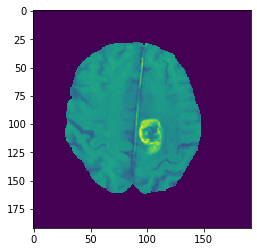

Predicted:- 


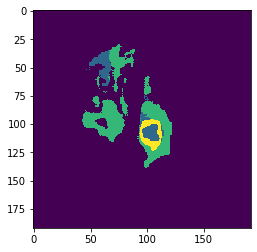

Actual:- 


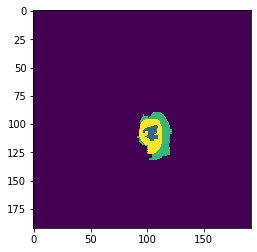

HGG test set no: 2 slice no: 461


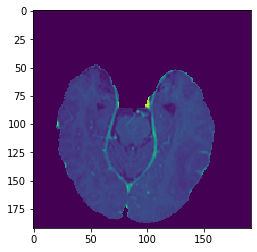

Predicted:- 


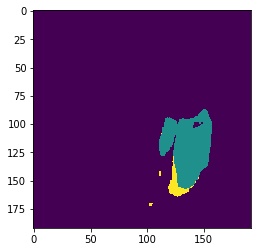

Actual:- 


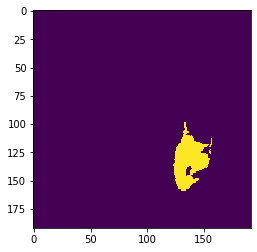

HGG test set no: 2 slice no: 462


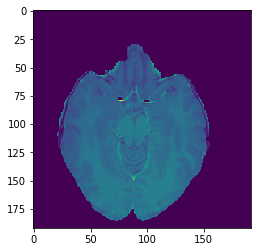

Predicted:- 


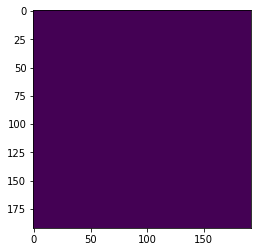

Actual:- 


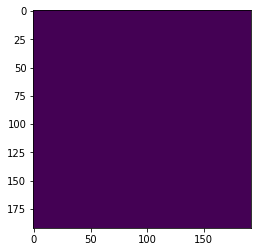

HGG test set no: 2 slice no: 463


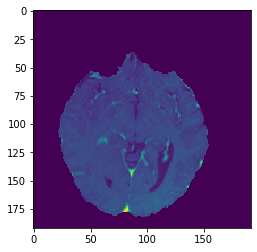

Predicted:- 


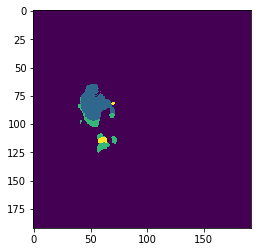

Actual:- 


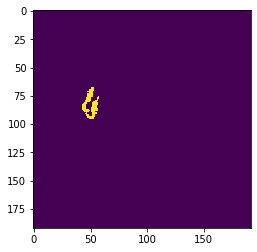

HGG test set no: 2 slice no: 464


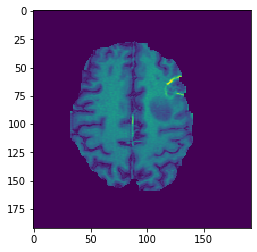

Predicted:- 


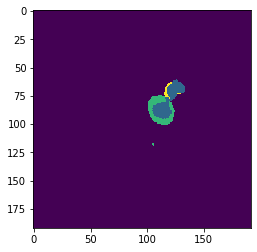

Actual:- 


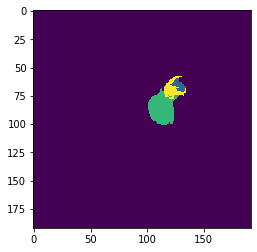

HGG test set no: 2 slice no: 465


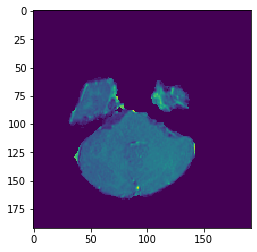

Predicted:- 


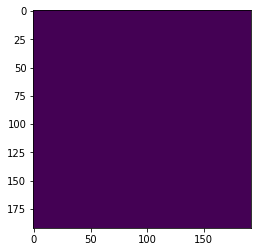

Actual:- 


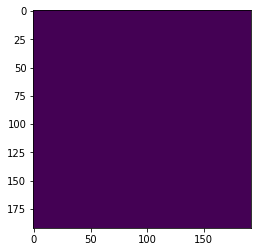

HGG test set no: 2 slice no: 466


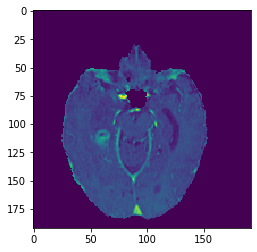

Predicted:- 


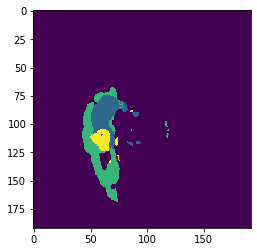

Actual:- 


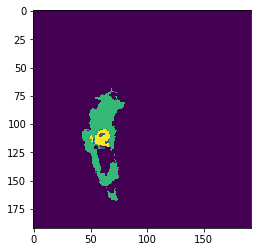

HGG test set no: 2 slice no: 467


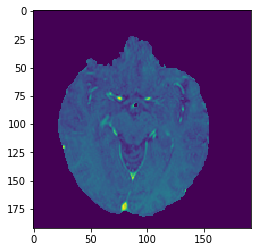

Predicted:- 


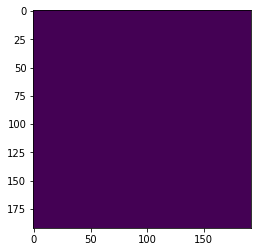

Actual:- 


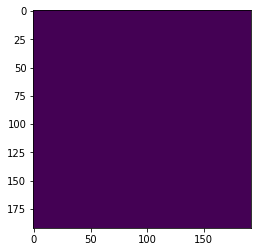

HGG test set no: 2 slice no: 468


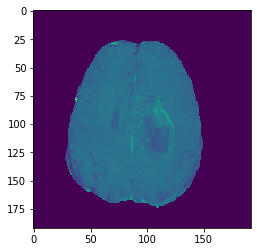

Predicted:- 


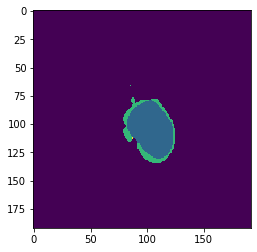

Actual:- 


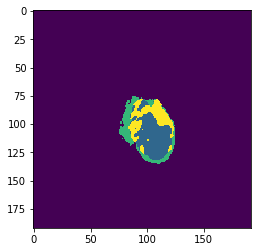

HGG test set no: 2 slice no: 469


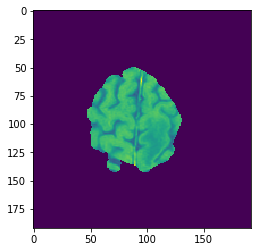

Predicted:- 


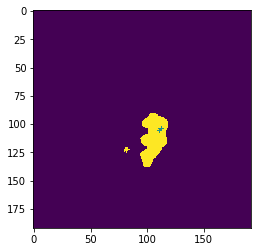

Actual:- 


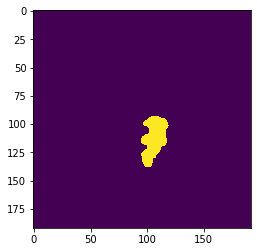

HGG test set no: 2 slice no: 470


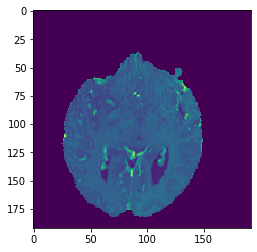

Predicted:- 


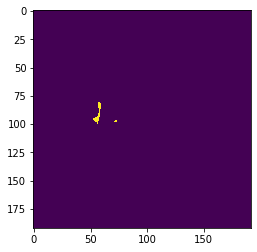

Actual:- 


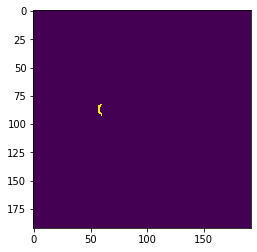

HGG test set no: 2 slice no: 471


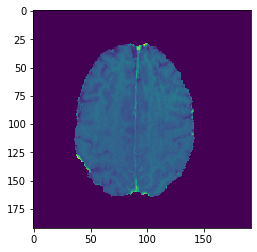

Predicted:- 


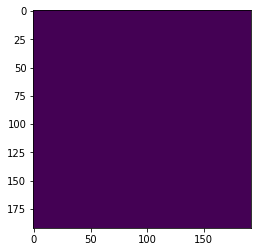

Actual:- 


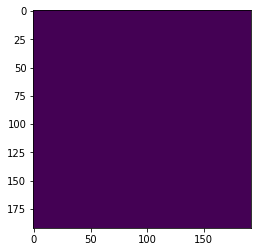

HGG test set no: 2 slice no: 472


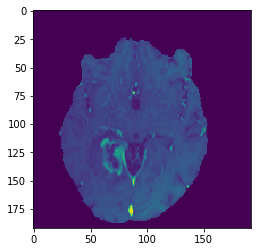

Predicted:- 


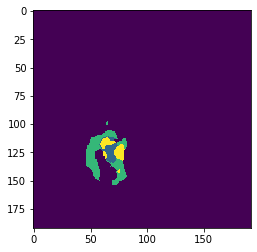

Actual:- 


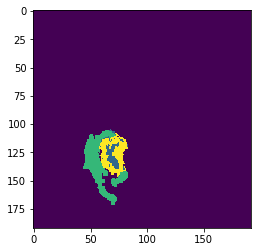

HGG test set no: 2 slice no: 473


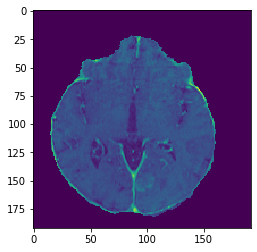

Predicted:- 


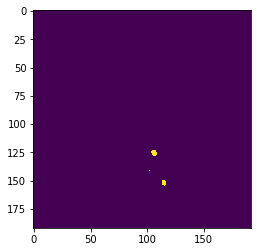

Actual:- 


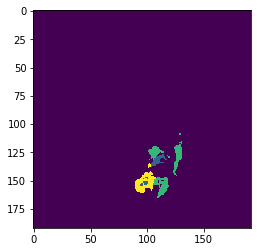

HGG test set no: 2 slice no: 474


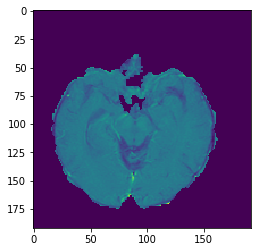

Predicted:- 


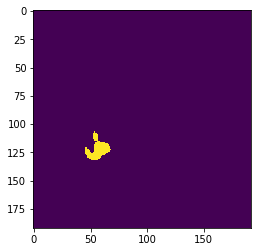

Actual:- 


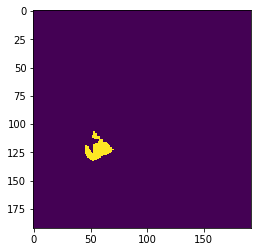

HGG test set no: 2 slice no: 475


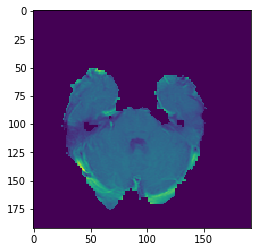

Predicted:- 


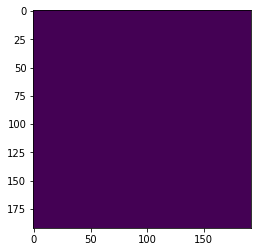

Actual:- 


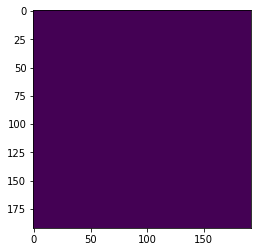

HGG test set no: 2 slice no: 476


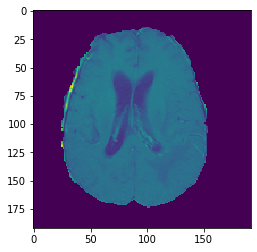

Predicted:- 


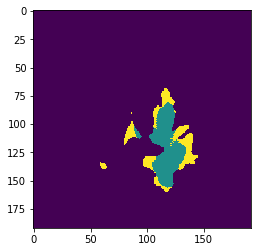

Actual:- 


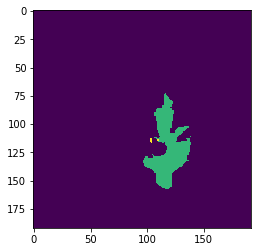

HGG test set no: 2 slice no: 477


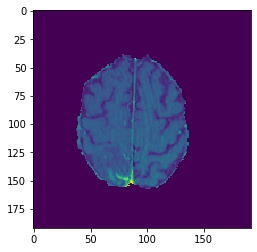

Predicted:- 


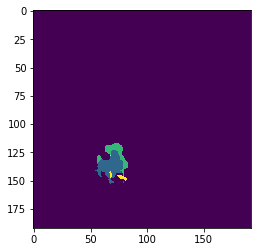

Actual:- 


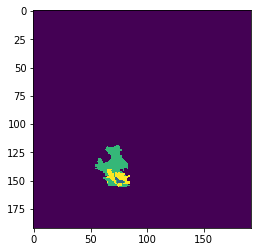

HGG test set no: 2 slice no: 478


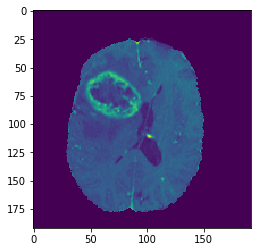

Predicted:- 


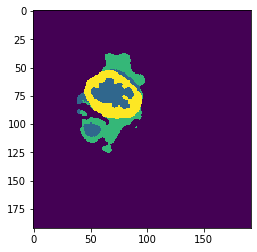

Actual:- 


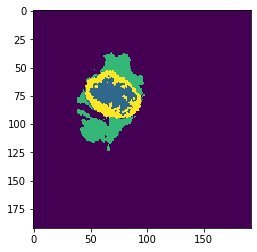

HGG test set no: 2 slice no: 479


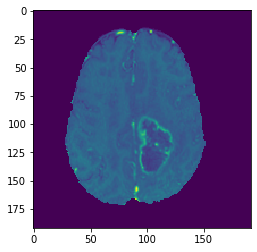

Predicted:- 


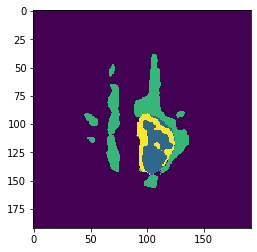

Actual:- 


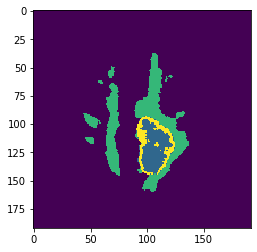

HGG test set no: 2 slice no: 480


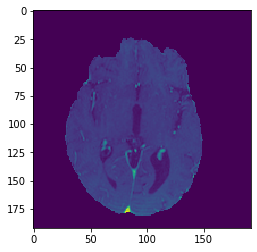

Predicted:- 


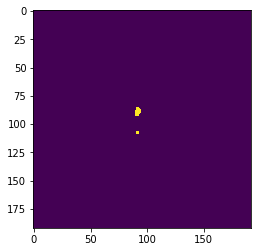

Actual:- 


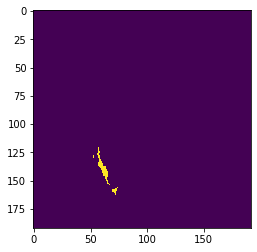

HGG test set no: 2 slice no: 481


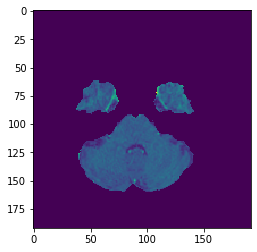

Predicted:- 


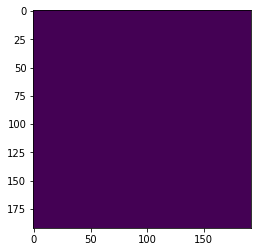

Actual:- 


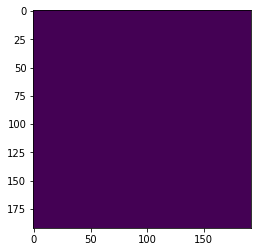

HGG test set no: 2 slice no: 482


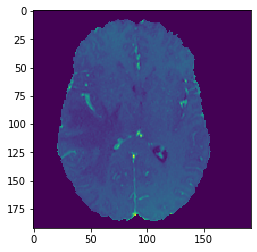

Predicted:- 


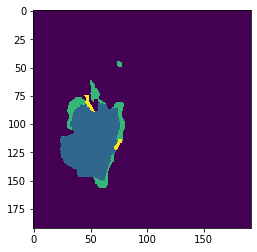

Actual:- 


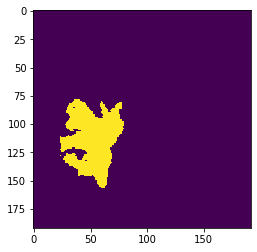

HGG test set no: 2 slice no: 483


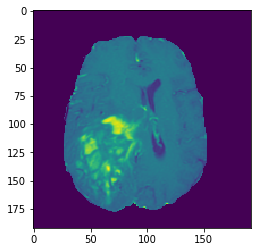

Predicted:- 


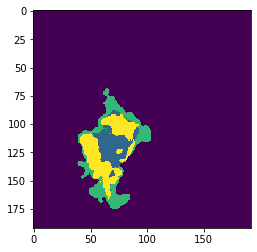

Actual:- 


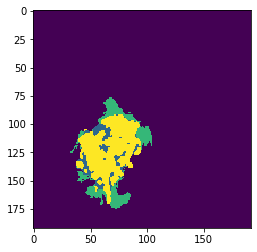

HGG test set no: 2 slice no: 484


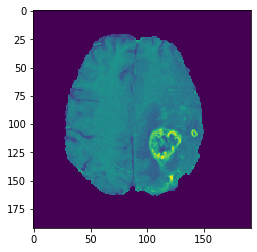

Predicted:- 


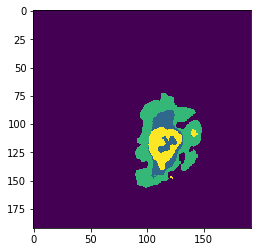

Actual:- 


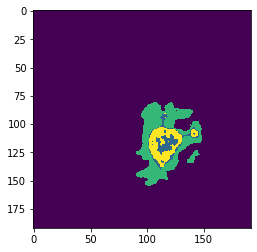

HGG test set no: 2 slice no: 485


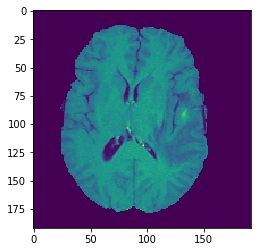

Predicted:- 


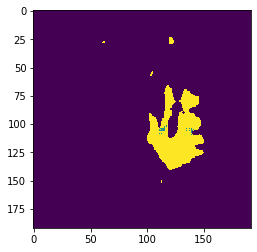

Actual:- 


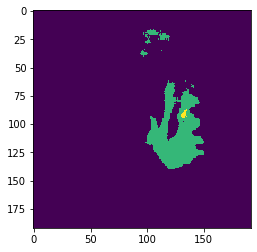

HGG test set no: 2 slice no: 486


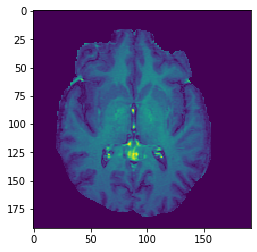

Predicted:- 


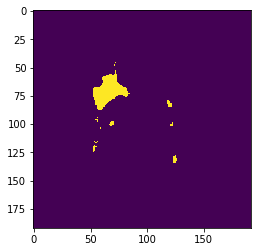

Actual:- 


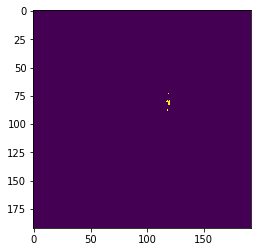

HGG test set no: 2 slice no: 487


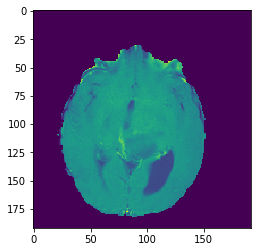

Predicted:- 


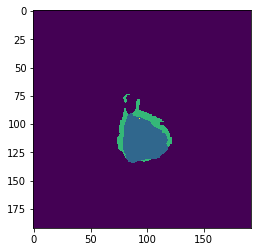

Actual:- 


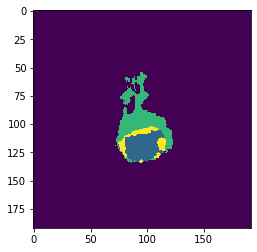

HGG test set no: 2 slice no: 488


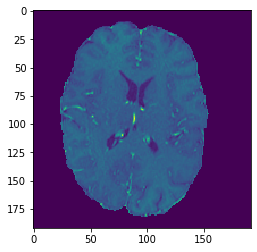

Predicted:- 


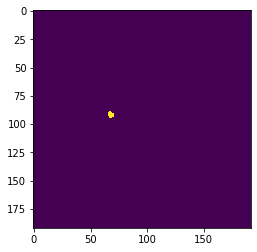

Actual:- 


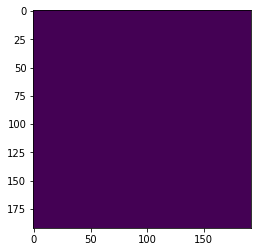

HGG test set no: 2 slice no: 489


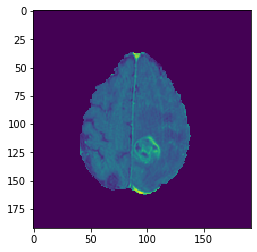

Predicted:- 


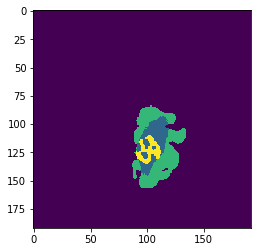

Actual:- 


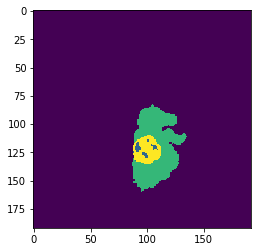

HGG test set no: 2 slice no: 490


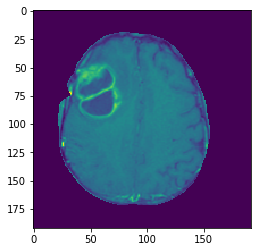

Predicted:- 


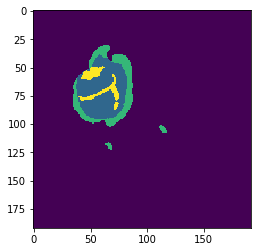

Actual:- 


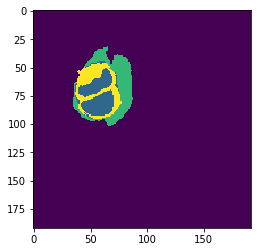

HGG test set no: 2 slice no: 491


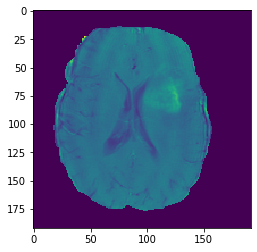

Predicted:- 


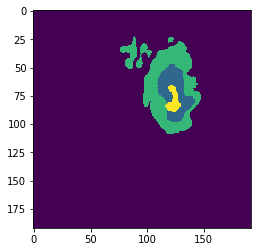

Actual:- 


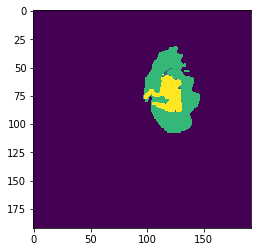

HGG test set no: 2 slice no: 492


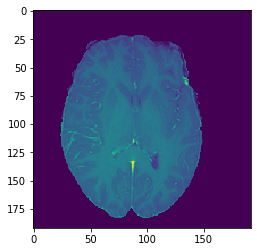

Predicted:- 


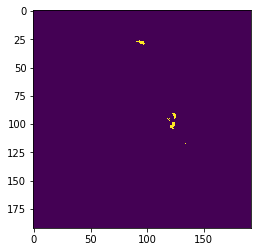

Actual:- 


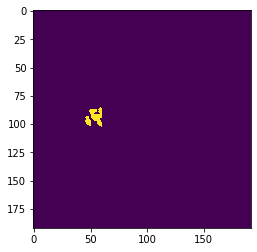

HGG test set no: 2 slice no: 493


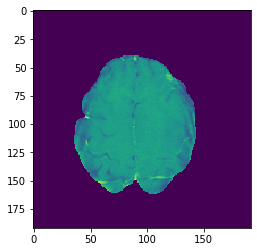

Predicted:- 


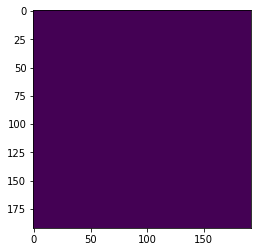

Actual:- 


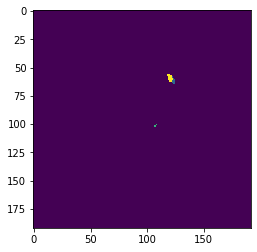

HGG test set no: 2 slice no: 494


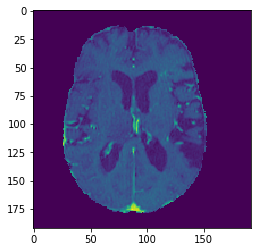

Predicted:- 


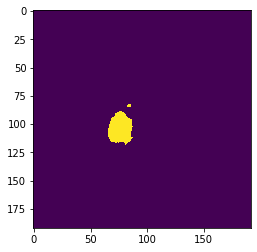

Actual:- 


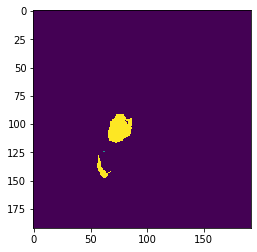

HGG test set no: 2 slice no: 495


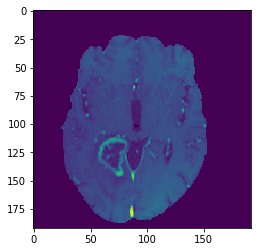

Predicted:- 


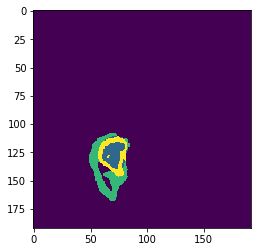

Actual:- 


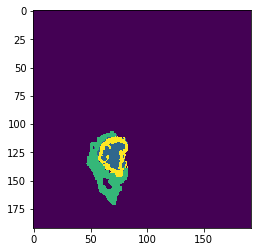

HGG test set no: 2 slice no: 496


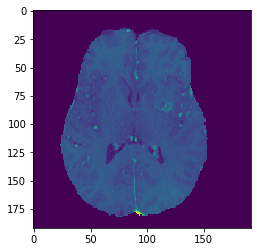

Predicted:- 


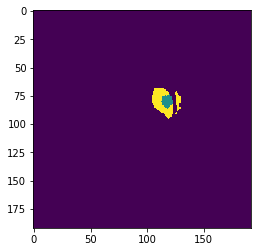

Actual:- 


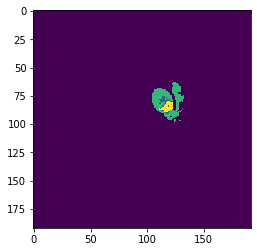

HGG test set no: 2 slice no: 497


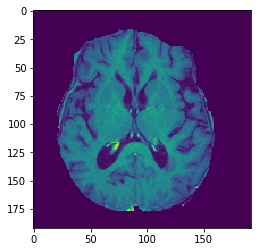

Predicted:- 


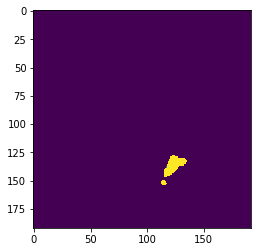

Actual:- 


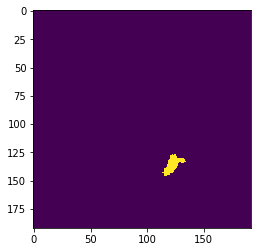

HGG test set no: 2 slice no: 498


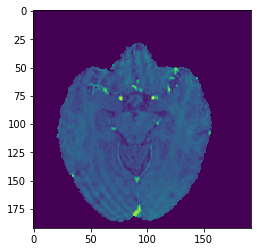

Predicted:- 


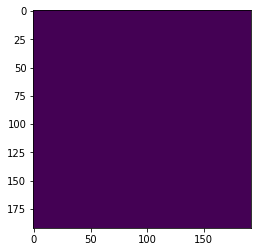

Actual:- 


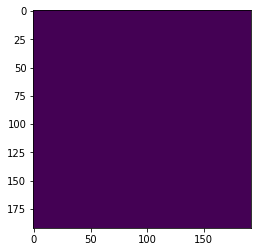

HGG test set no: 2 slice no: 499


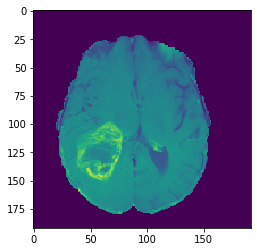

Predicted:- 


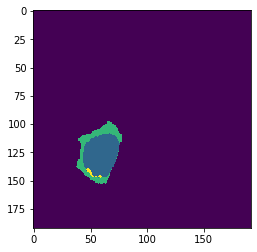

Actual:- 


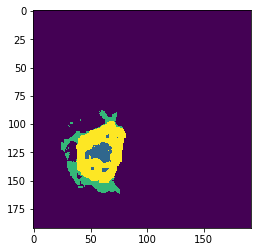

HGG test set no: 3 slice no: 450


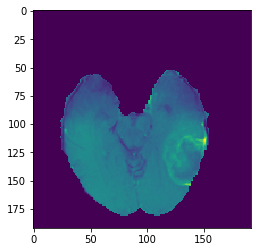

Predicted:- 


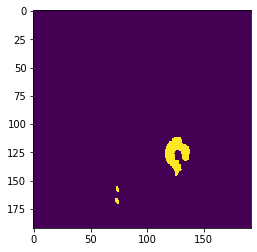

Actual:- 


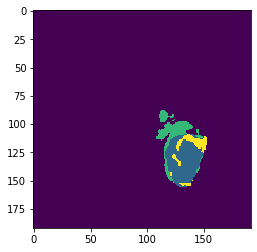

HGG test set no: 3 slice no: 451


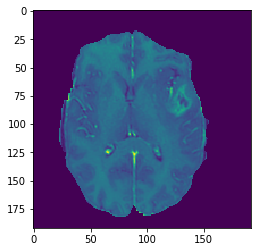

Predicted:- 


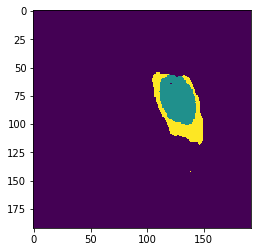

Actual:- 


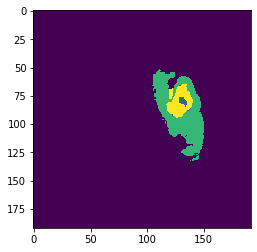

HGG test set no: 3 slice no: 452


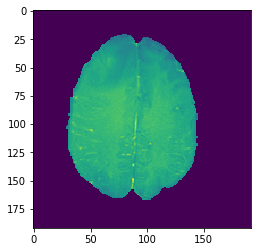

Predicted:- 


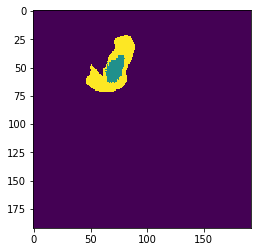

Actual:- 


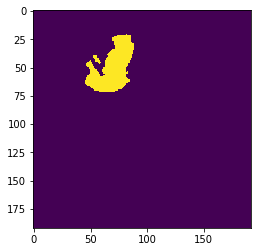

HGG test set no: 3 slice no: 453


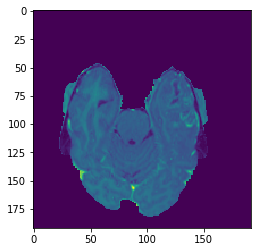

Predicted:- 


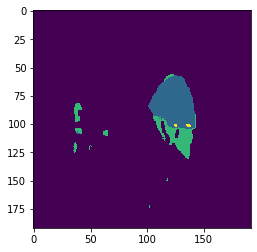

Actual:- 


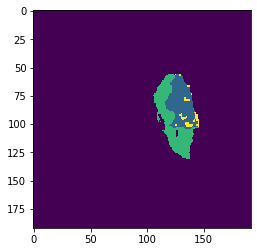

HGG test set no: 3 slice no: 454


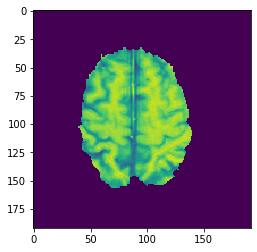

Predicted:- 


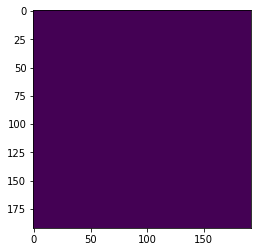

Actual:- 


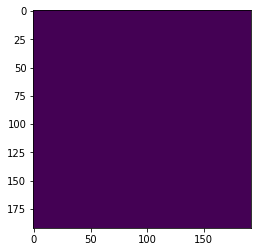

HGG test set no: 3 slice no: 455


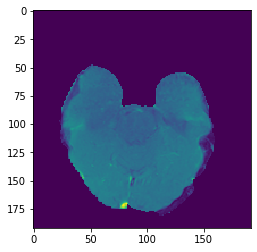

Predicted:- 


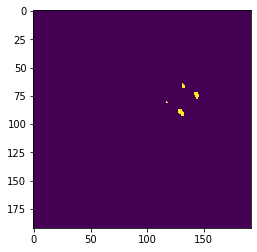

Actual:- 


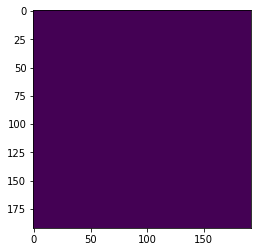

HGG test set no: 3 slice no: 456


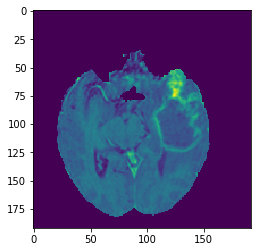

Predicted:- 


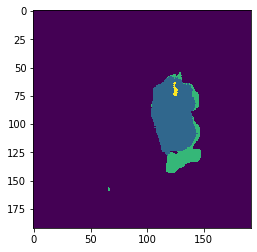

Actual:- 


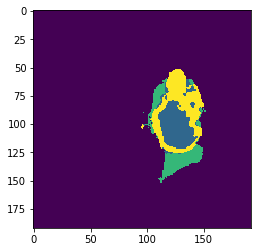

HGG test set no: 3 slice no: 457


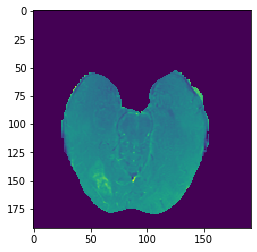

Predicted:- 


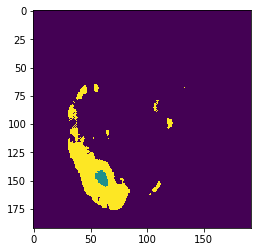

Actual:- 


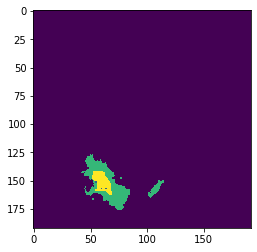

HGG test set no: 3 slice no: 458


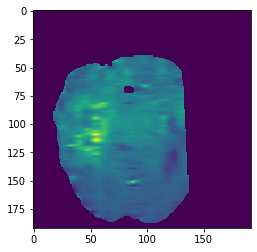

Predicted:- 


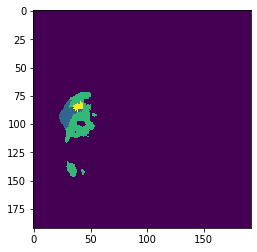

Actual:- 


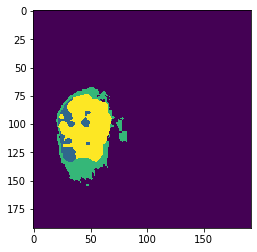

HGG test set no: 3 slice no: 459


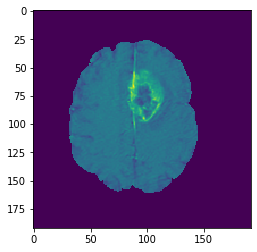

Predicted:- 


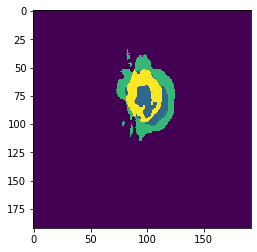

Actual:- 


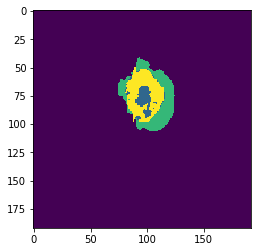

HGG test set no: 3 slice no: 460


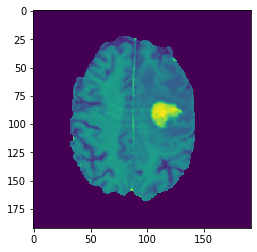

Predicted:- 


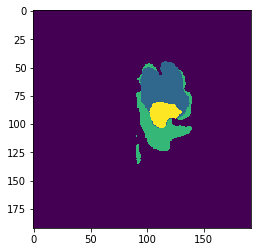

Actual:- 


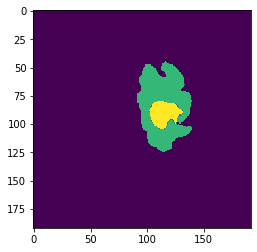

HGG test set no: 3 slice no: 461


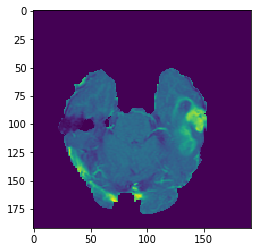

Predicted:- 


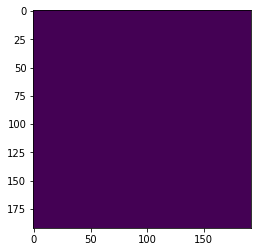

Actual:- 


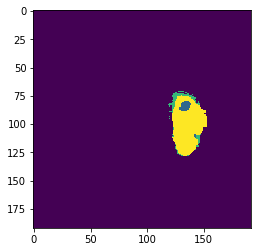

HGG test set no: 3 slice no: 462


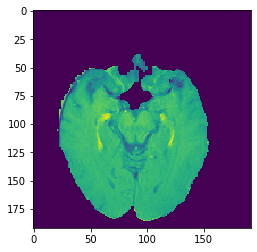

Predicted:- 


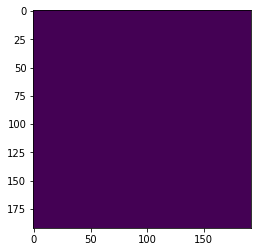

Actual:- 


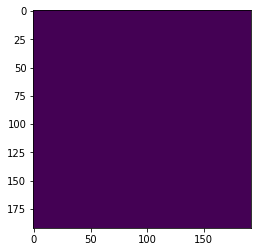

HGG test set no: 3 slice no: 463


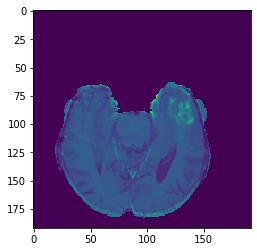

Predicted:- 


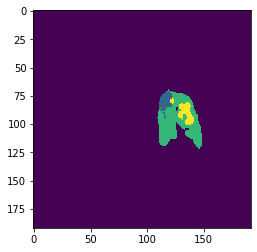

Actual:- 


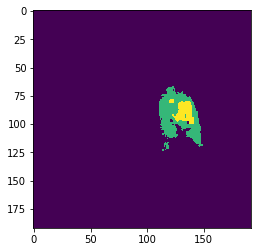

HGG test set no: 3 slice no: 464


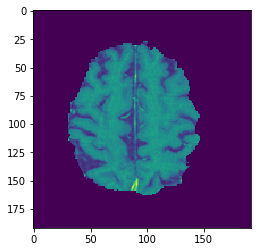

Predicted:- 


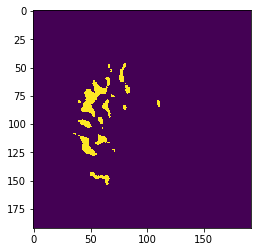

Actual:- 


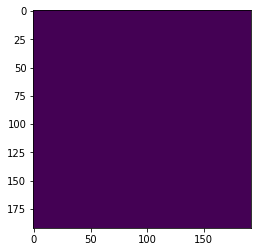

HGG test set no: 3 slice no: 465


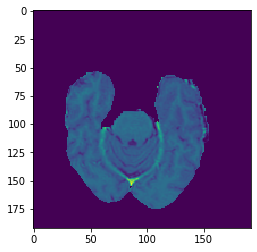

Predicted:- 


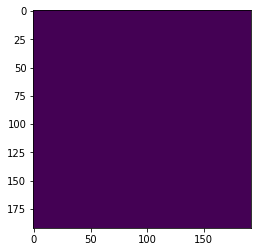

Actual:- 


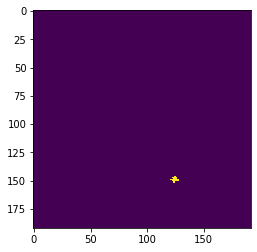

HGG test set no: 3 slice no: 466


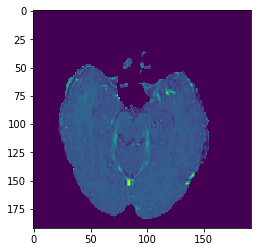

Predicted:- 


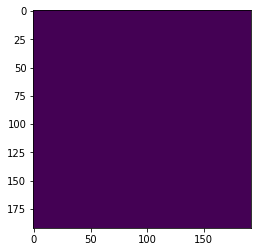

Actual:- 


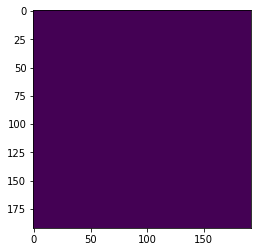

HGG test set no: 3 slice no: 467


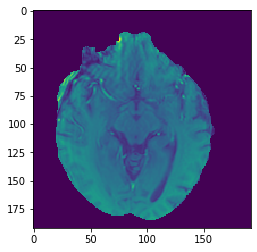

Predicted:- 


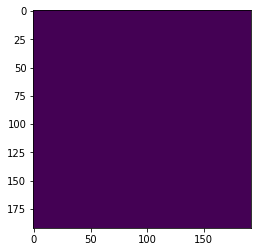

Actual:- 


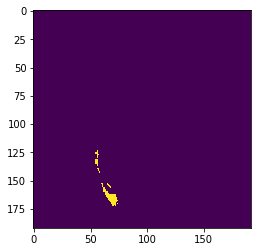

HGG test set no: 3 slice no: 468


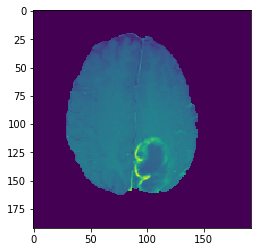

Predicted:- 


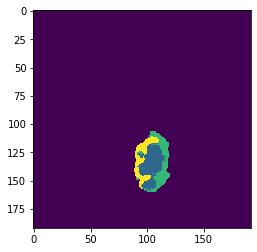

Actual:- 


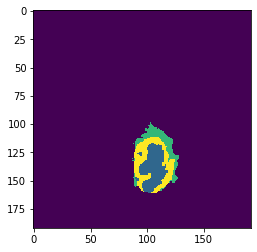

HGG test set no: 3 slice no: 469


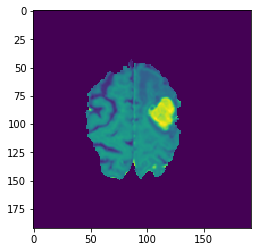

Predicted:- 


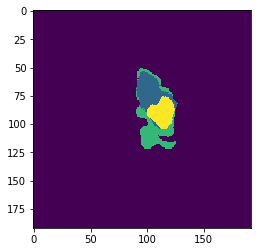

Actual:- 


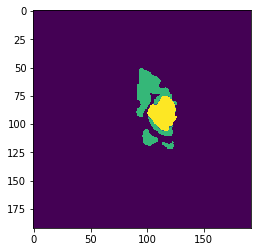

HGG test set no: 3 slice no: 470


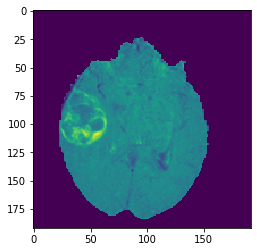

Predicted:- 


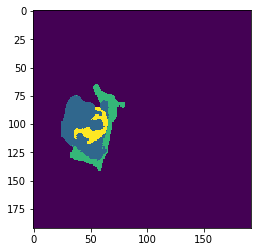

Actual:- 


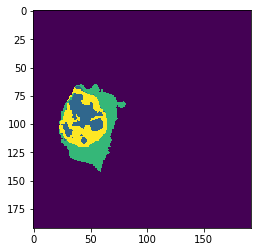

HGG test set no: 3 slice no: 471


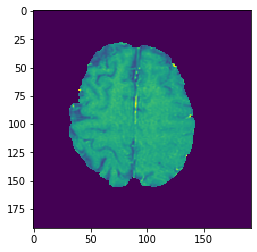

Predicted:- 


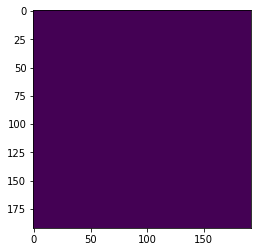

Actual:- 


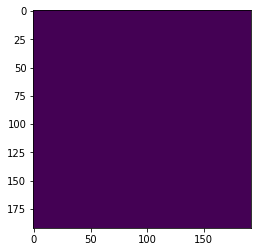

HGG test set no: 3 slice no: 472


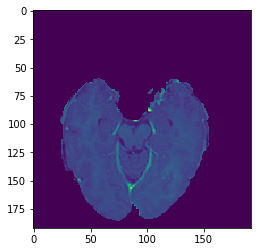

Predicted:- 


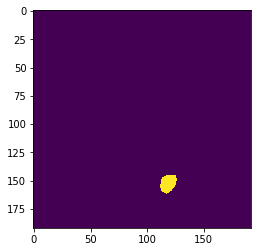

Actual:- 


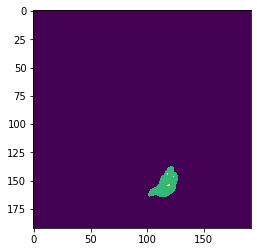

HGG test set no: 3 slice no: 473


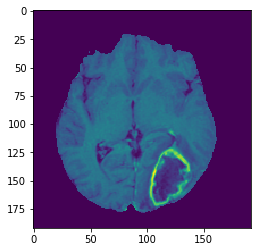

Predicted:- 


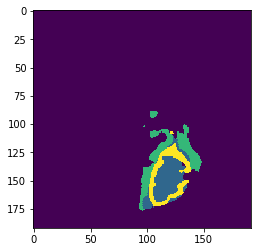

Actual:- 


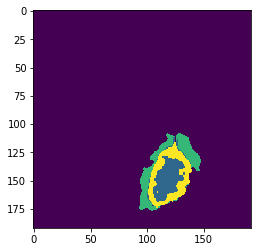

HGG test set no: 3 slice no: 474


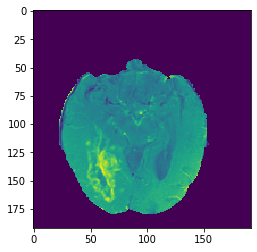

Predicted:- 


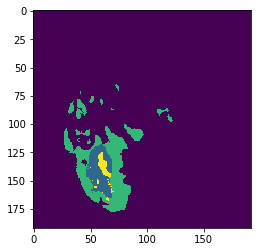

Actual:- 


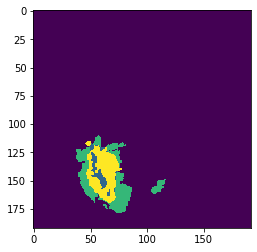

HGG test set no: 3 slice no: 475


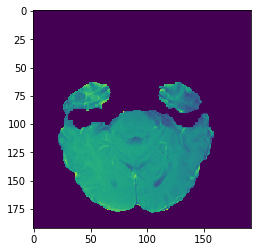

Predicted:- 


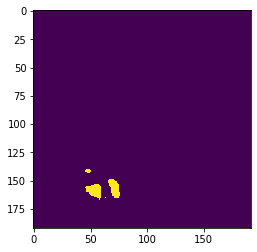

Actual:- 


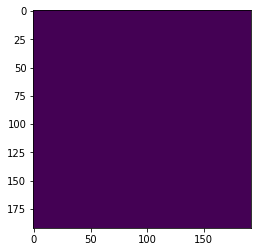

HGG test set no: 3 slice no: 476


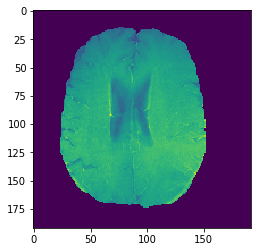

Predicted:- 


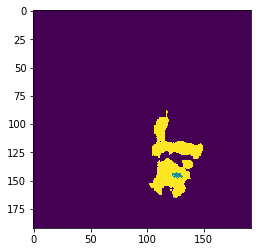

Actual:- 


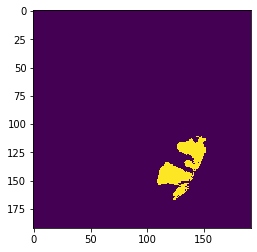

HGG test set no: 3 slice no: 477


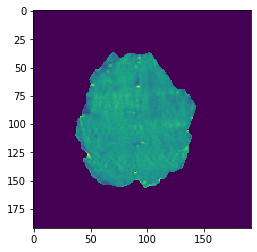

Predicted:- 


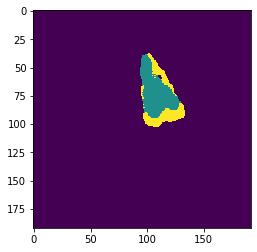

Actual:- 


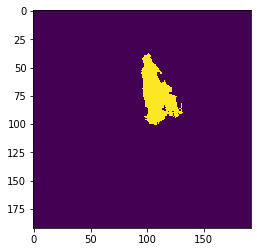

HGG test set no: 3 slice no: 478


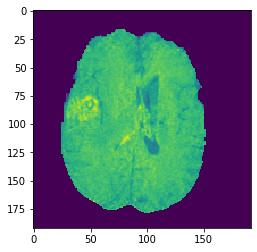

Predicted:- 


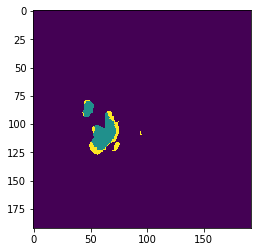

Actual:- 


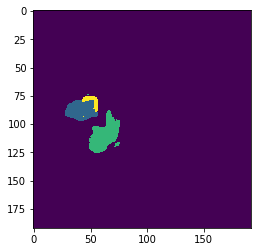

HGG test set no: 3 slice no: 479


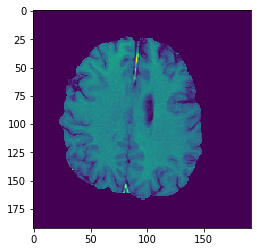

Predicted:- 


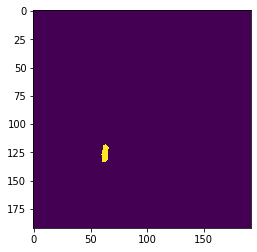

Actual:- 


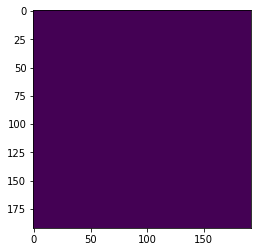

HGG test set no: 3 slice no: 480


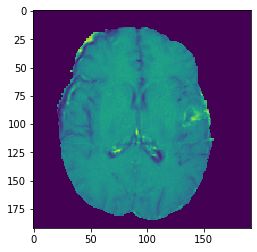

Predicted:- 


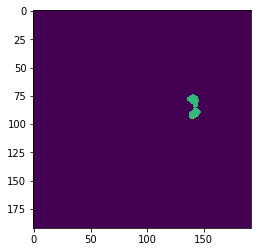

Actual:- 


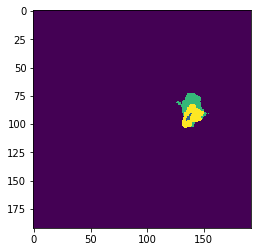

HGG test set no: 3 slice no: 481


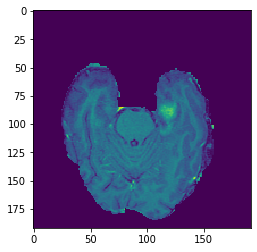

Predicted:- 


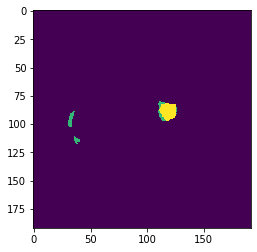

Actual:- 


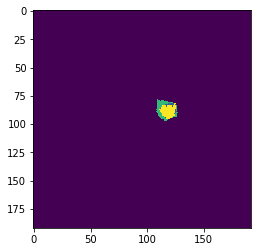

HGG test set no: 3 slice no: 482


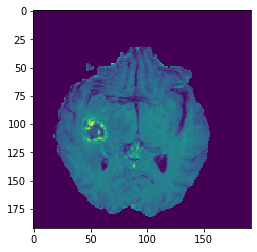

Predicted:- 


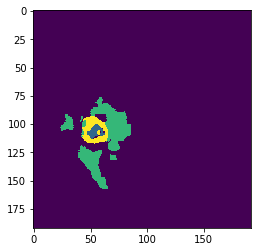

Actual:- 


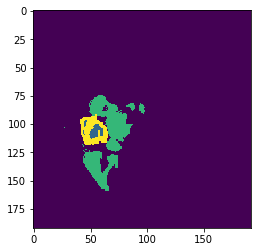

HGG test set no: 3 slice no: 483


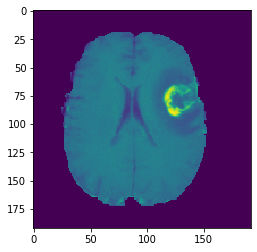

Predicted:- 


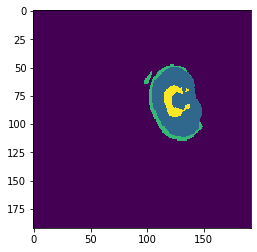

Actual:- 


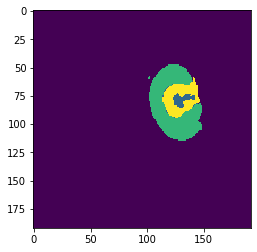

HGG test set no: 3 slice no: 484


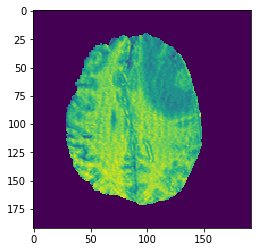

Predicted:- 


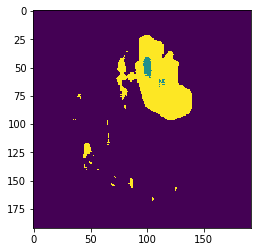

Actual:- 


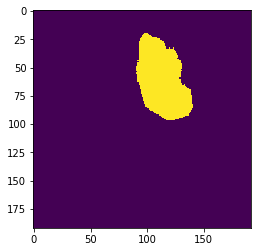

HGG test set no: 3 slice no: 485


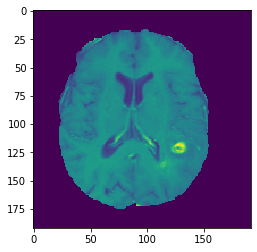

Predicted:- 


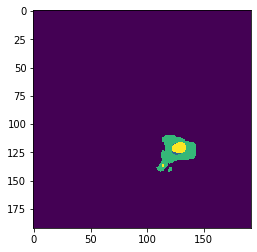

Actual:- 


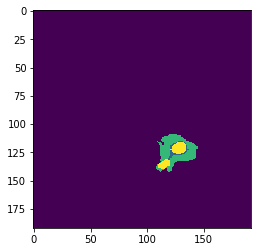

HGG test set no: 3 slice no: 486


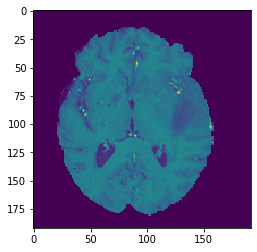

Predicted:- 


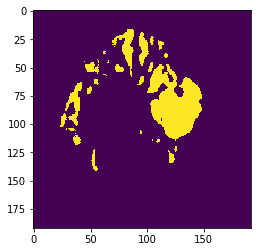

Actual:- 


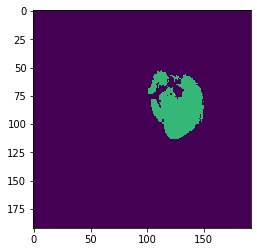

HGG test set no: 3 slice no: 487


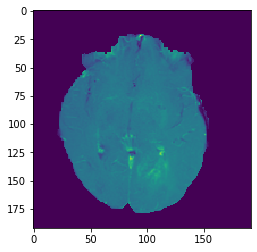

Predicted:- 


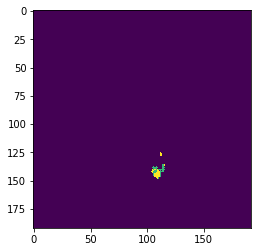

Actual:- 


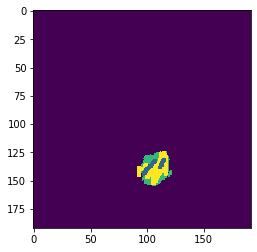

HGG test set no: 3 slice no: 488


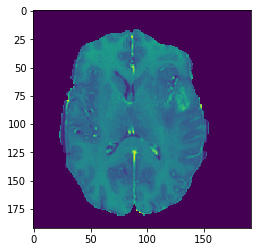

Predicted:- 


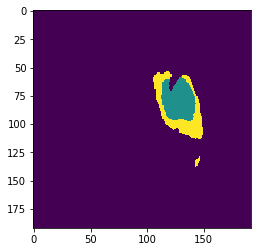

Actual:- 


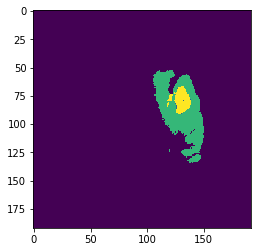

HGG test set no: 3 slice no: 489


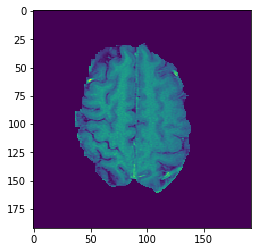

Predicted:- 


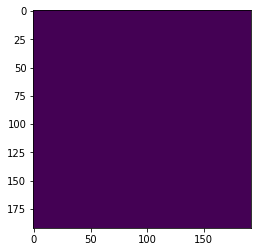

Actual:- 


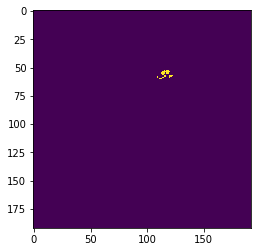

HGG test set no: 3 slice no: 490


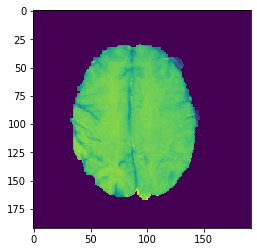

Predicted:- 


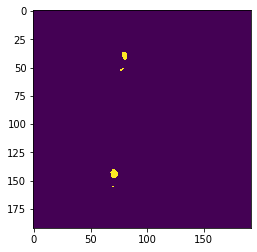

Actual:- 


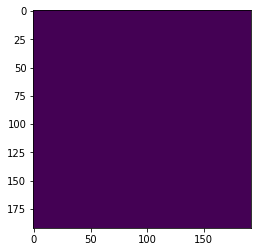

HGG test set no: 3 slice no: 491


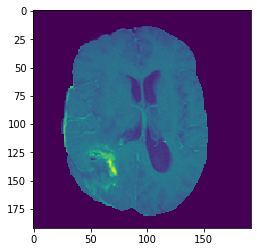

Predicted:- 


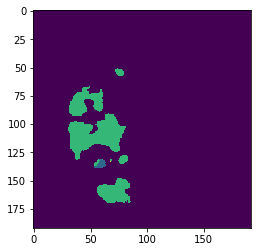

Actual:- 


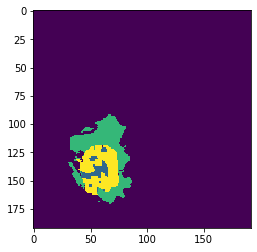

HGG test set no: 3 slice no: 492


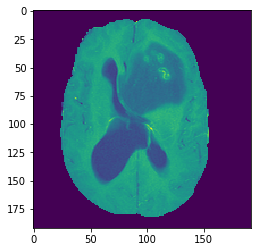

Predicted:- 


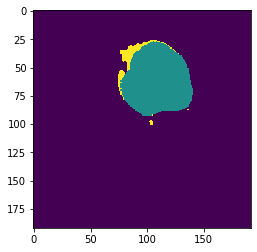

Actual:- 


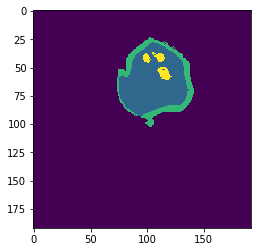

HGG test set no: 3 slice no: 493


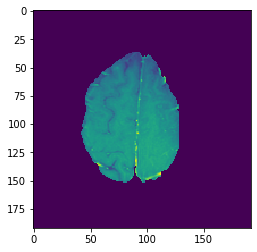

Predicted:- 


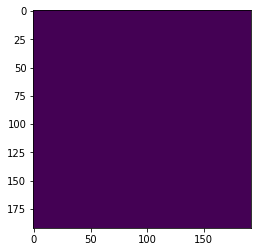

Actual:- 


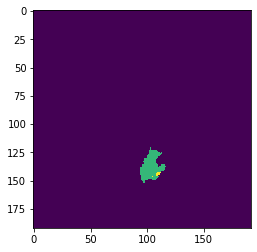

HGG test set no: 3 slice no: 494


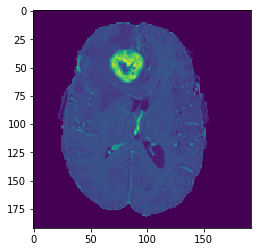

Predicted:- 


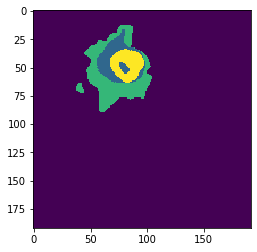

Actual:- 


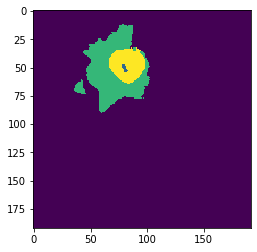

HGG test set no: 3 slice no: 495


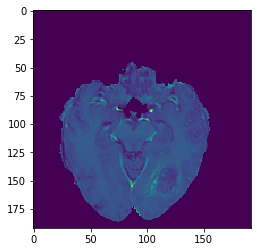

Predicted:- 


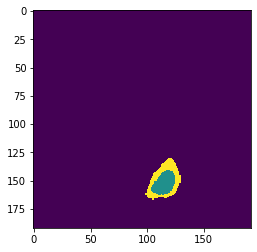

Actual:- 


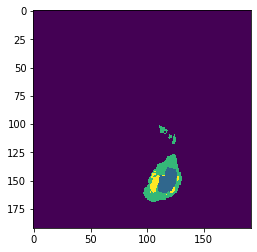

HGG test set no: 3 slice no: 496


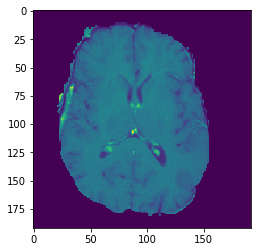

Predicted:- 


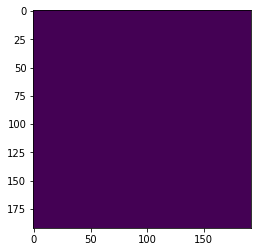

Actual:- 


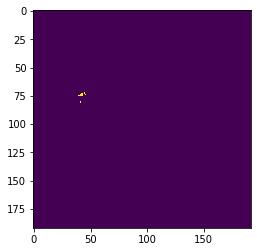

HGG test set no: 3 slice no: 497


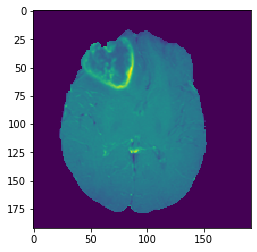

Predicted:- 


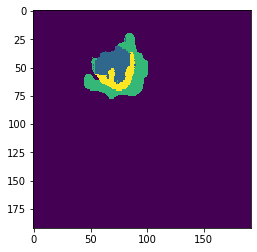

Actual:- 


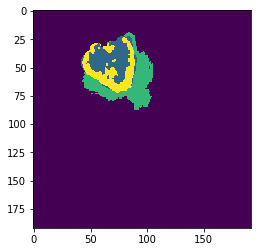

HGG test set no: 3 slice no: 498


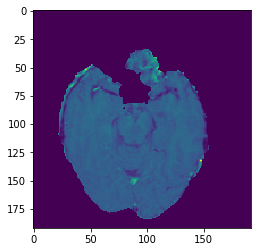

Predicted:- 


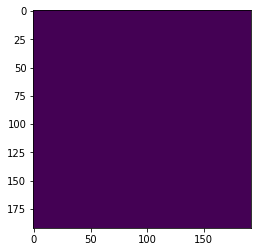

Actual:- 


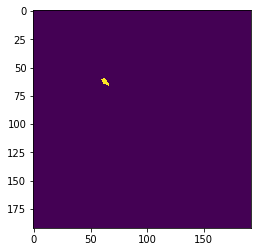

HGG test set no: 3 slice no: 499


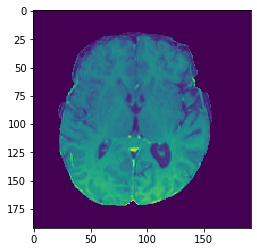

Predicted:- 


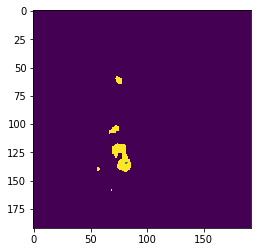

Actual:- 


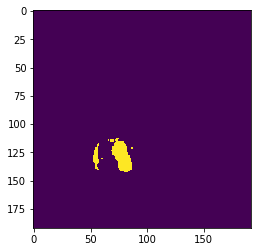

LGG test slice no: 450


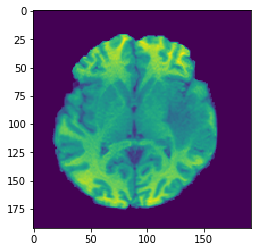

Predicted:- 


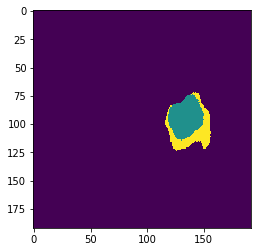

Actual:- 


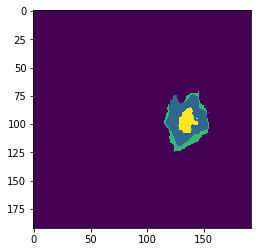

LGG test slice no: 451


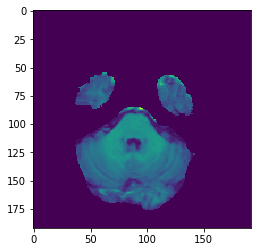

Predicted:- 


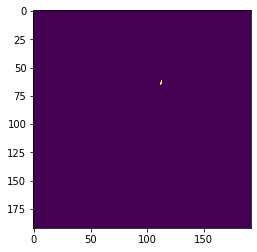

Actual:- 


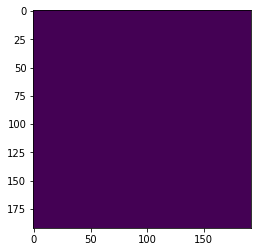

LGG test slice no: 452


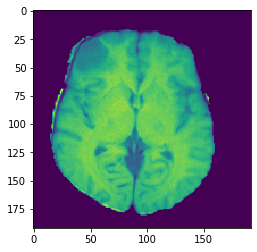

Predicted:- 


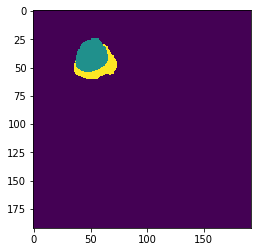

Actual:- 


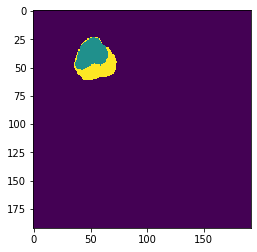

LGG test slice no: 453


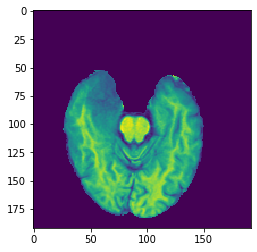

Predicted:- 


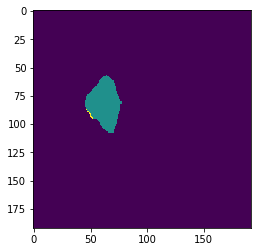

Actual:- 


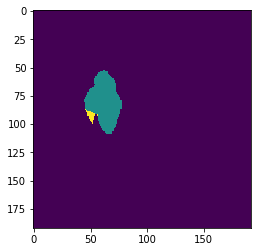

LGG test slice no: 454


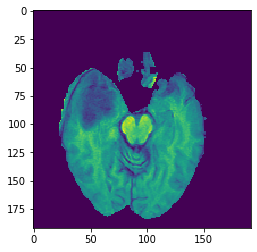

Predicted:- 


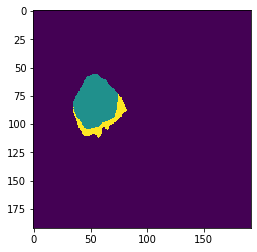

Actual:- 


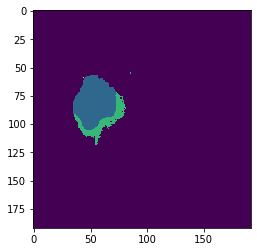

LGG test slice no: 455


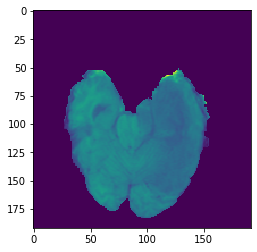

Predicted:- 


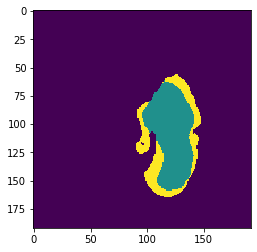

Actual:- 


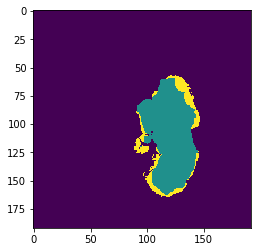

LGG test slice no: 456


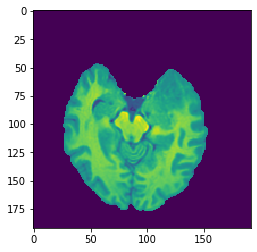

Predicted:- 


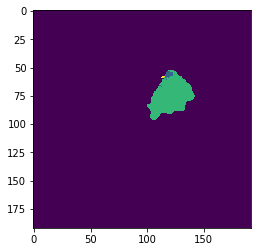

Actual:- 


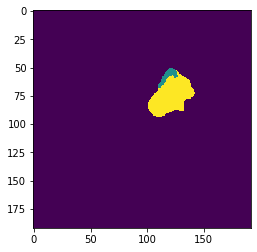

LGG test slice no: 457


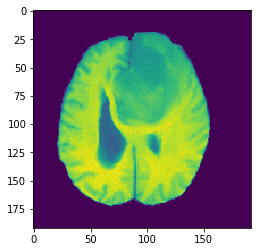

Predicted:- 


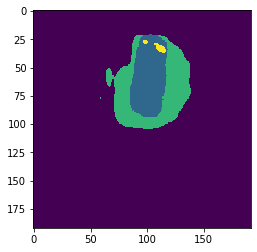

Actual:- 


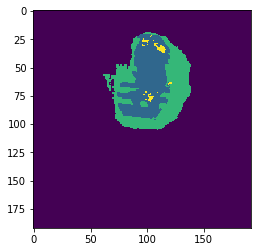

LGG test slice no: 458


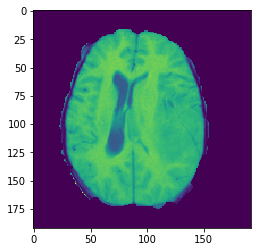

Predicted:- 


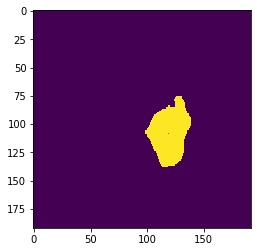

Actual:- 


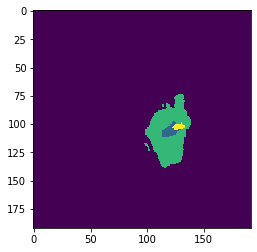

LGG test slice no: 459


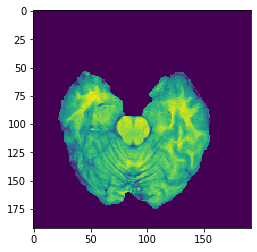

Predicted:- 


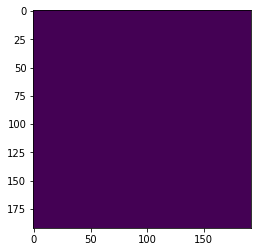

Actual:- 


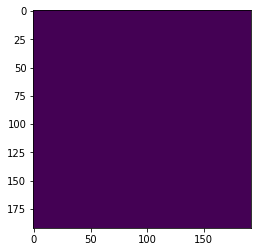

LGG test slice no: 460


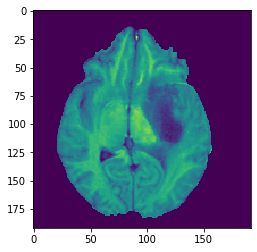

Predicted:- 


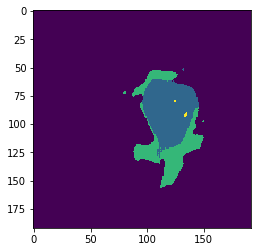

Actual:- 


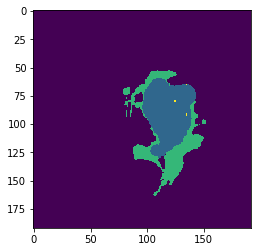

LGG test slice no: 461


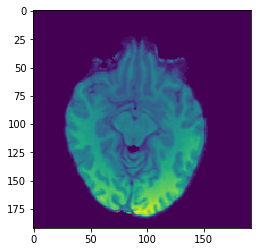

Predicted:- 


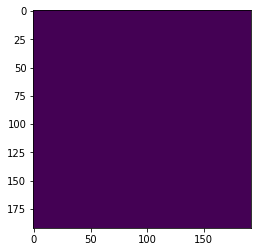

Actual:- 


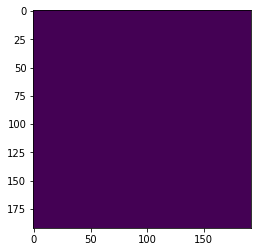

LGG test slice no: 462


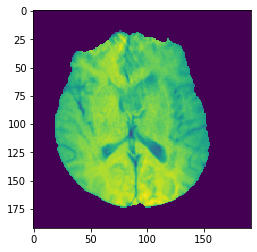

Predicted:- 


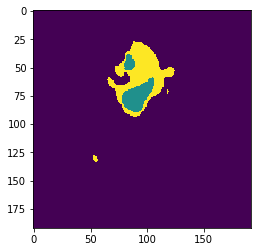

Actual:- 


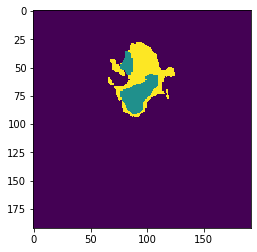

LGG test slice no: 463


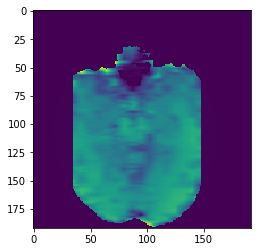

Predicted:- 


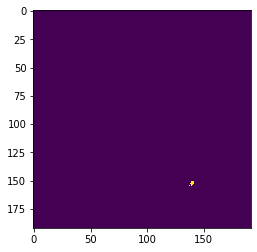

Actual:- 


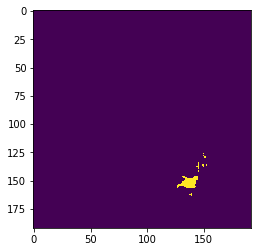

LGG test slice no: 464


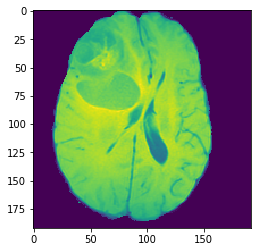

Predicted:- 


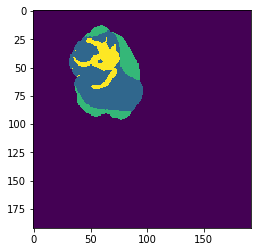

Actual:- 


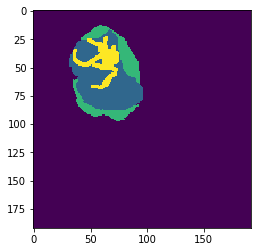

LGG test slice no: 465


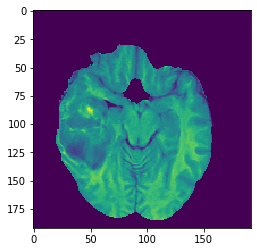

Predicted:- 


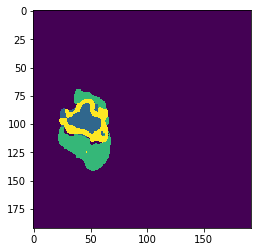

Actual:- 


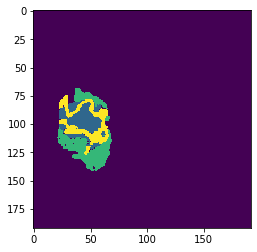

LGG test slice no: 466


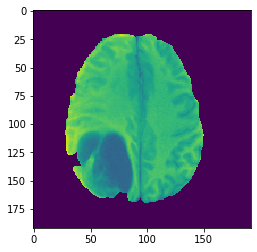

Predicted:- 


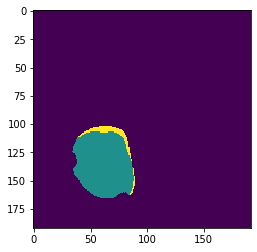

Actual:- 


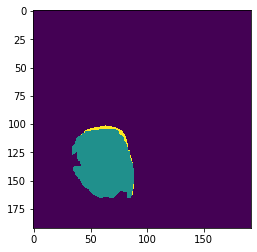

LGG test slice no: 467


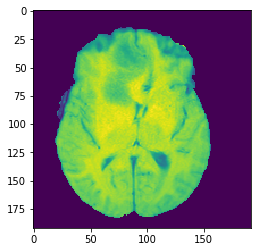

Predicted:- 


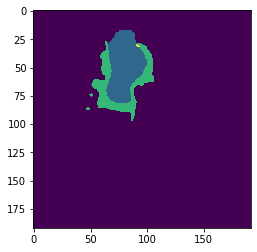

Actual:- 


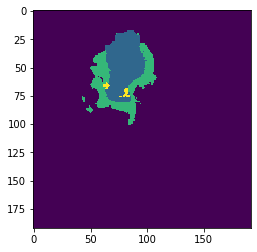

LGG test slice no: 468


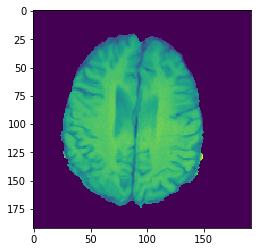

Predicted:- 


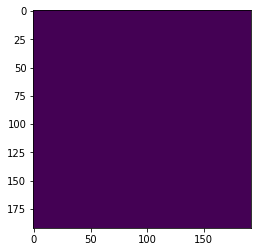

Actual:- 


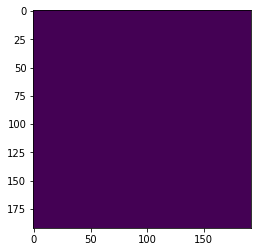

LGG test slice no: 469


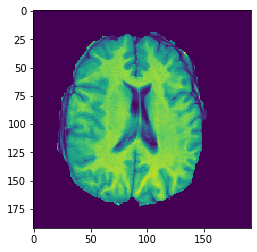

Predicted:- 


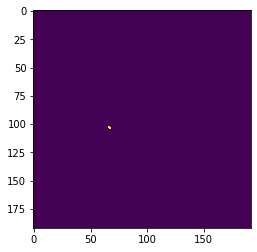

Actual:- 


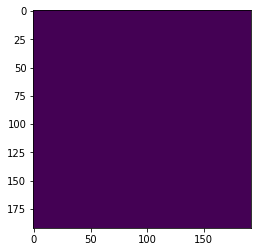

LGG test slice no: 470


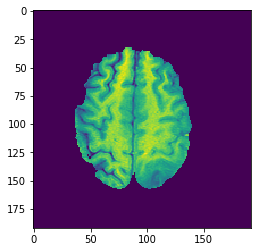

Predicted:- 


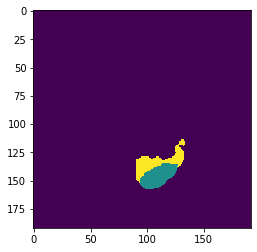

Actual:- 


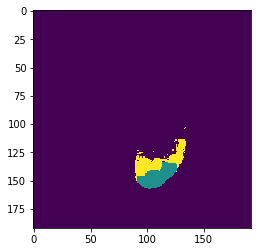

LGG test slice no: 471


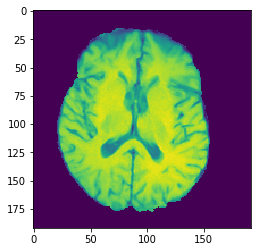

Predicted:- 


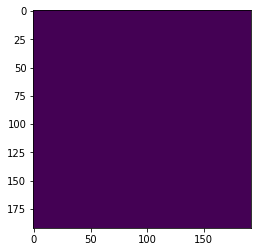

Actual:- 


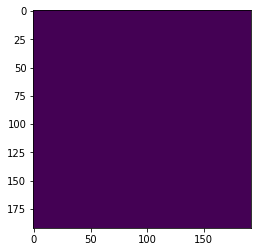

LGG test slice no: 472


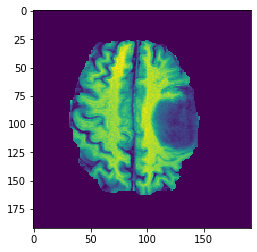

Predicted:- 


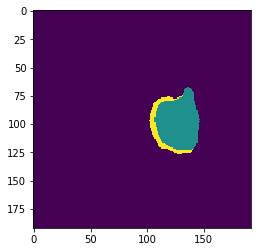

Actual:- 


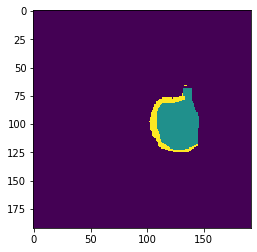

LGG test slice no: 473


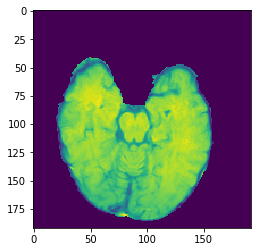

Predicted:- 


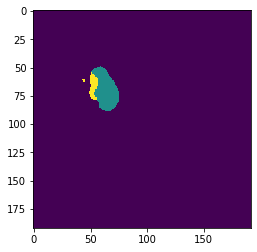

Actual:- 


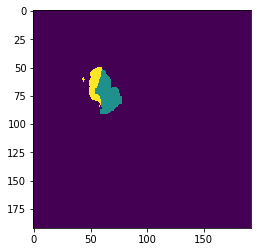

LGG test slice no: 474


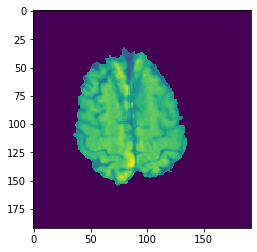

Predicted:- 


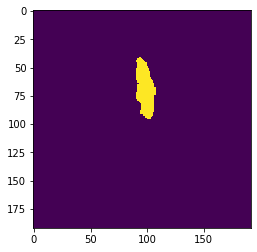

Actual:- 


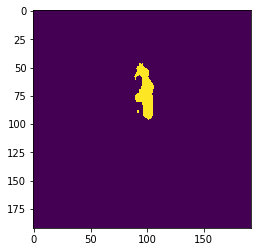

LGG test slice no: 475


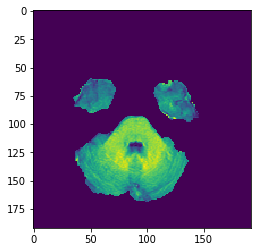

Predicted:- 


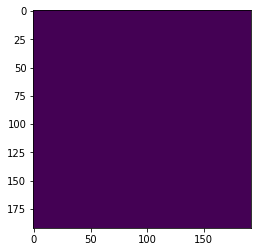

Actual:- 


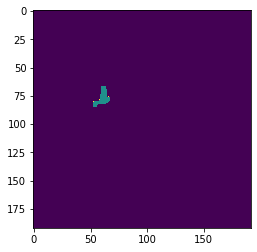

LGG test slice no: 476


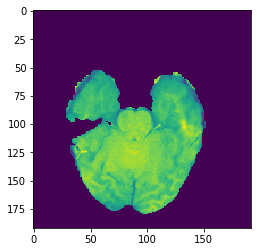

Predicted:- 


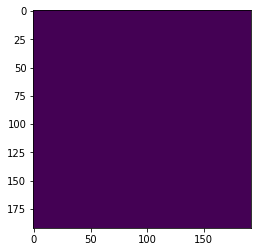

Actual:- 


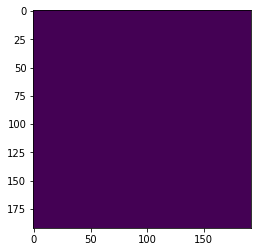

LGG test slice no: 477


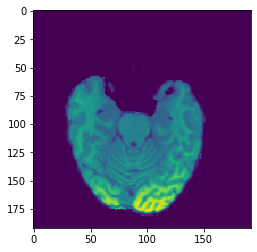

Predicted:- 


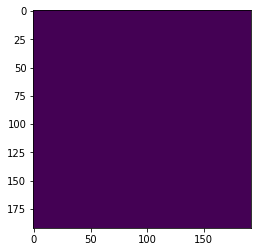

Actual:- 


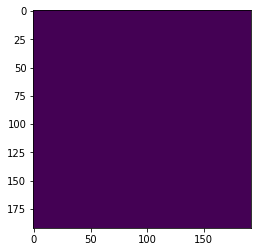

LGG test slice no: 478


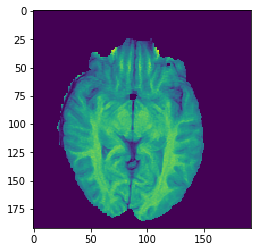

Predicted:- 


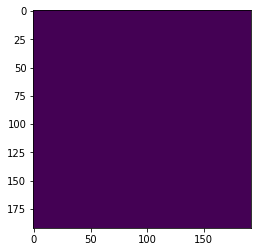

Actual:- 


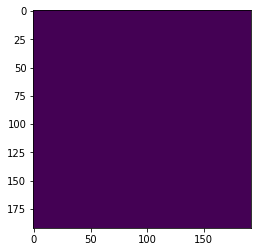

LGG test slice no: 479


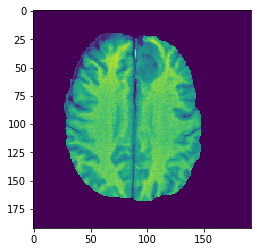

Predicted:- 


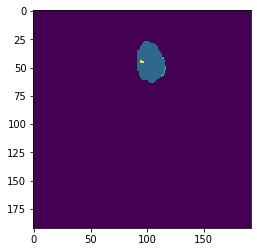

Actual:- 


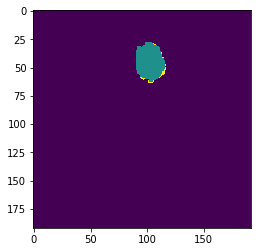

LGG test slice no: 480


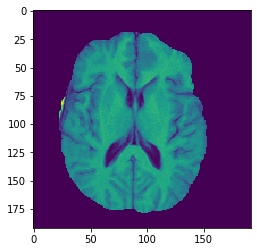

Predicted:- 


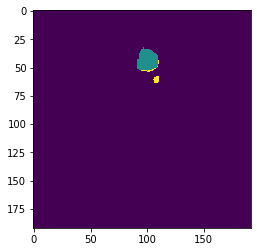

Actual:- 


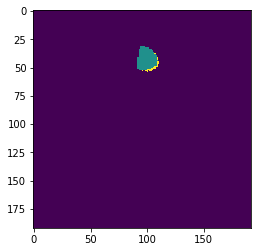

LGG test slice no: 481


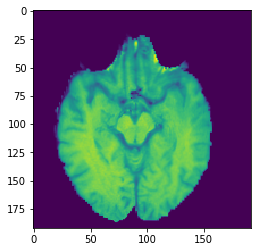

Predicted:- 


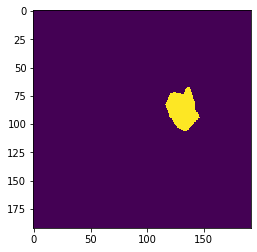

Actual:- 


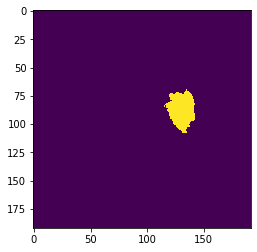

LGG test slice no: 482


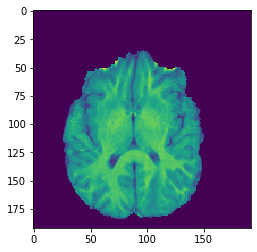

Predicted:- 


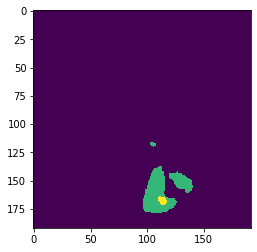

Actual:- 


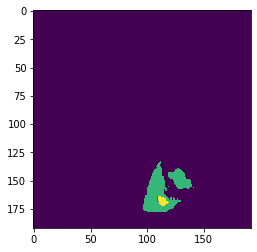

LGG test slice no: 483


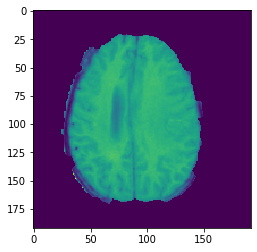

Predicted:- 


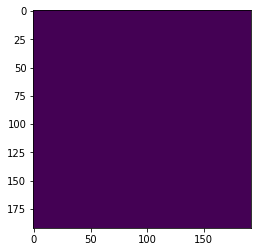

Actual:- 


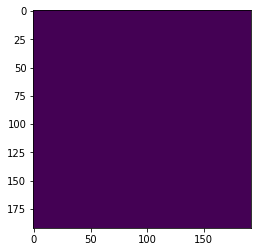

LGG test slice no: 484


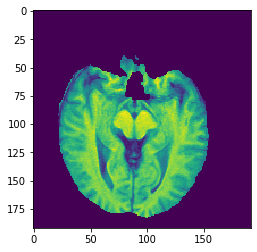

Predicted:- 


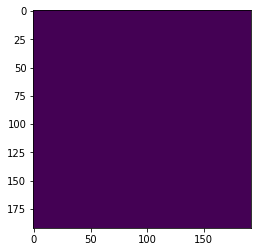

Actual:- 


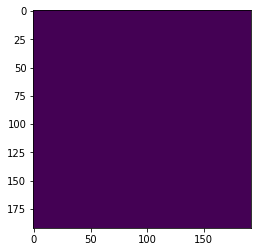

LGG test slice no: 485


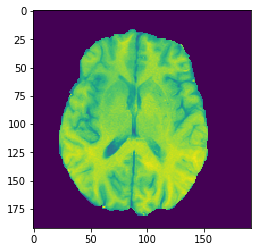

Predicted:- 


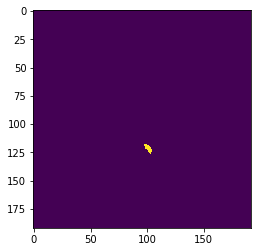

Actual:- 


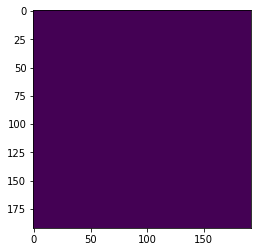

LGG test slice no: 486


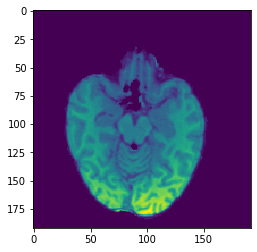

Predicted:- 


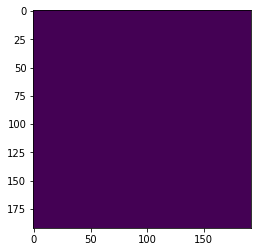

Actual:- 


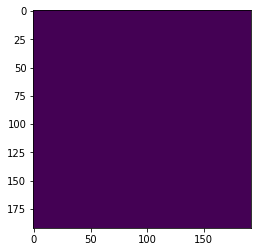

LGG test slice no: 487


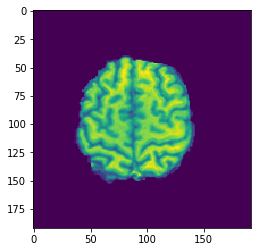

Predicted:- 


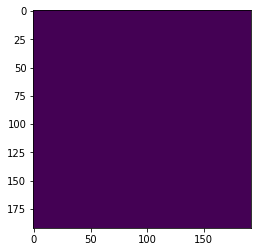

Actual:- 


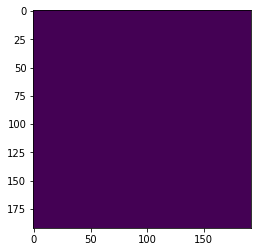

LGG test slice no: 488


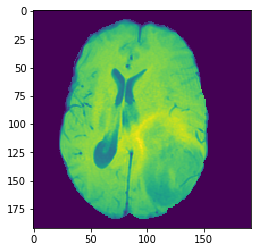

Predicted:- 


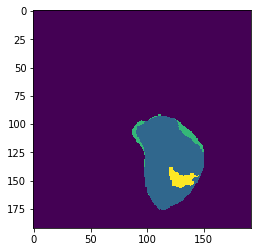

Actual:- 


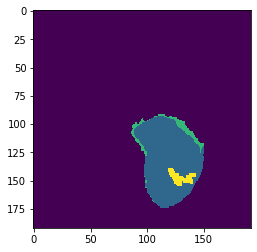

LGG test slice no: 489


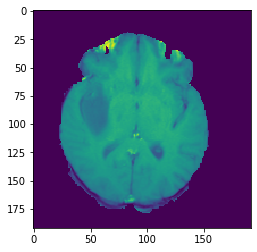

Predicted:- 


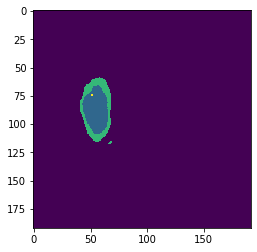

Actual:- 


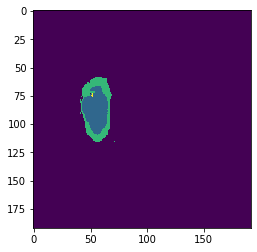

LGG test slice no: 490


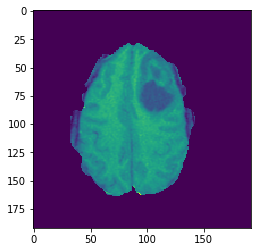

Predicted:- 


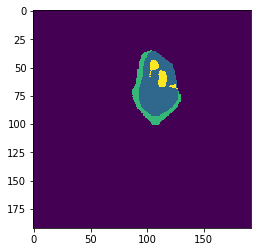

Actual:- 


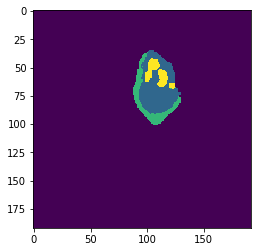

LGG test slice no: 491


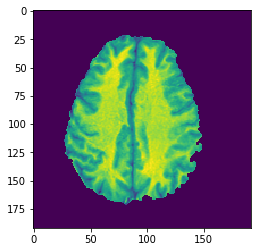

Predicted:- 


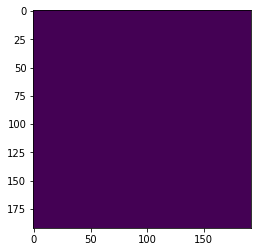

Actual:- 


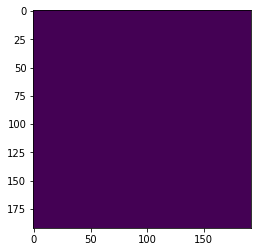

LGG test slice no: 492


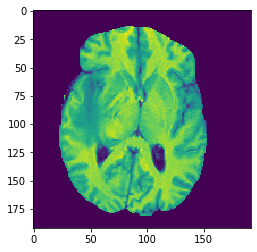

Predicted:- 


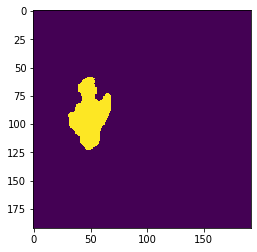

Actual:- 


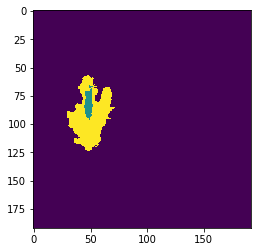

LGG test slice no: 493


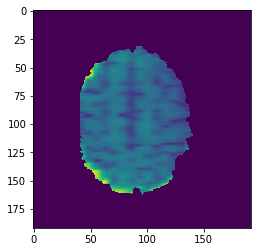

Predicted:- 


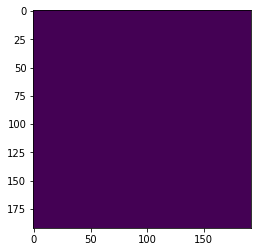

Actual:- 


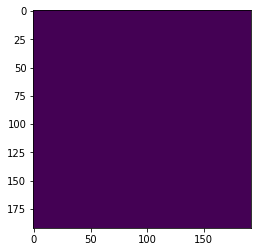

LGG test slice no: 494


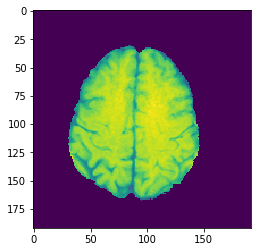

Predicted:- 


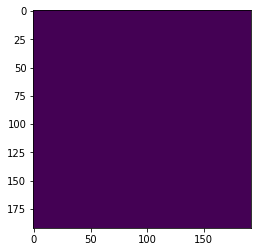

Actual:- 


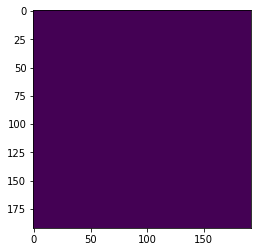

LGG test slice no: 495


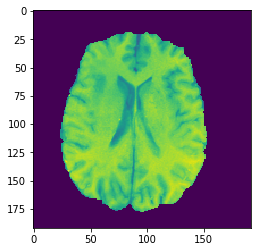

Predicted:- 


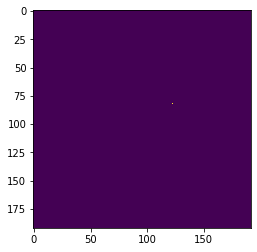

Actual:- 


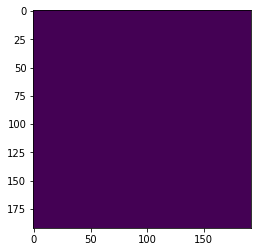

LGG test slice no: 496


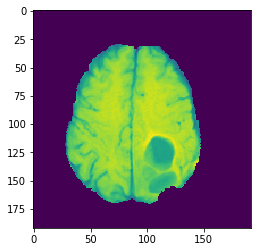

Predicted:- 


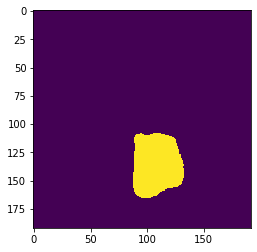

Actual:- 


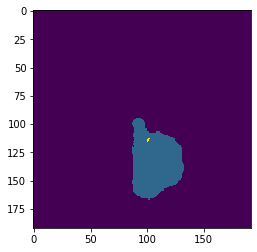

LGG test slice no: 497


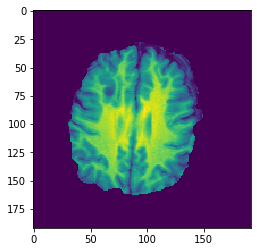

Predicted:- 


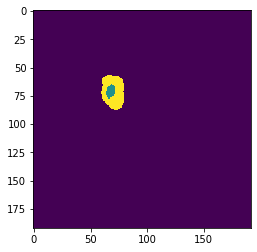

Actual:- 


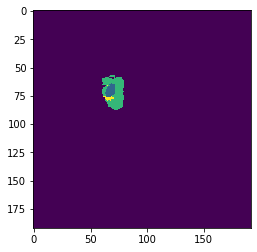

LGG test slice no: 498


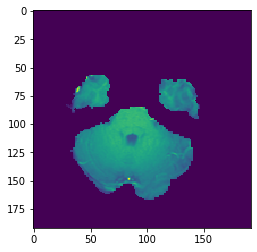

Predicted:- 


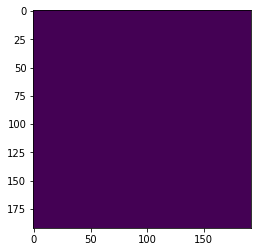

Actual:- 


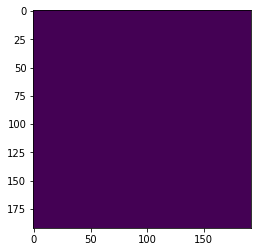

LGG test slice no: 499


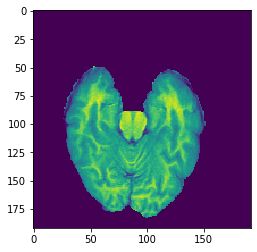

Predicted:- 


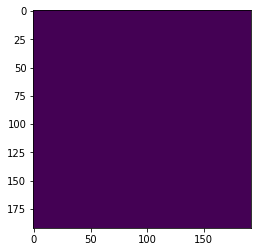

Actual:- 


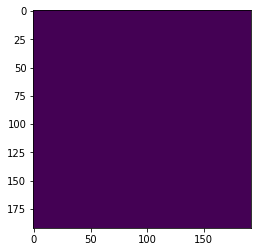

In [ ]:
import matplotlib.pyplot as plt
for i in range(450,500):
  print('HGG test set no: 1 '+ 'slice no: ' + str(i))
  plt.imshow(X_test1[i,:,:,2])
  plt.show()
  print('Predicted:- ')
  plt.imshow(Y_pred1[i,:,:,0])
  plt.show()
  print('Actual:- ')
  plt.imshow(Y_test1[i,:,:,0])
  plt.show()
for i in range(450,500):
  print('HGG test set no: 2 '+ 'slice no: ' + str(i))
  plt.imshow(X_test2[i,:,:,2])
  plt.show()
  print('Predicted:- ')
  plt.imshow(Y_pred2[i,:,:,0])
  plt.show()
  print('Actual:- ')
  plt.imshow(Y_test2[i,:,:,0])
  plt.show()
for i in range(450,500):
  print('HGG test set no: 3 '+ 'slice no: ' + str(i))
  plt.imshow(X_test3[i,:,:,2])
  plt.show()
  print('Predicted:- ')
  plt.imshow(Y_pred3[i,:,:,0])
  plt.show()
  print('Actual:- ')
  plt.imshow(Y_test3[i,:,:,0])
  plt.show()
for i in range(450,500):
  print('LGG test slice no: ' + str(i))
  plt.imshow(X_test4[i,:,:,1])
  plt.show()
  print('Predicted:- ')
  plt.imshow(Y_pred4[i,:,:,0])
  plt.show()
  print('Actual:- ')
  plt.imshow(Y_test4[i,:,:,0])
  plt.show()